In [1]:
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
import seaborn as sns

import torch
from torch import nn
from torch.optim import Adam
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

from enum import Enum
import pickle

from tqdm import tqdm

from torch.utils.data import ConcatDataset

device = "cuda" if torch.cuda.is_available() else "cpu"
torch.set_default_device(device)
print(f"{device=}")

device='cuda'


# Functions

In [2]:
# Observation space
class Tile(Enum):
  OCEAN = 0
  SUBMARINE = 1
  ISLAND = 2
  TRAVELLED = 3

# Action space
class Action(Enum):
  UP = 0
  DOWN = 1
  LEFT = 2
  RIGHT = 3
  NOTHING = 4

_vectorize_action = {
    # Going from row 1 to 0 is UP
    Action.UP.value:      np.array([ -1 ,  0 ]),
    # Going from row 0 to 1 is DOWN
    Action.DOWN.value:    np.array([  1 ,  0 ]),
    # Going from column 1 to 0 is LEFT
    Action.LEFT.value:    np.array([  0 , -1 ]),
    # Going from column 0 to 1 is RIGHT
    Action.RIGHT.value:   np.array([  0 ,  1 ]),
    Action.NOTHING.value: np.array([  0 ,  0 ]),
}

In [3]:
board_initial = np.array(
    [
        [0, 0, 0, 0, 0,  0, 0, 0, 0, 0,  0, 0, 0, 0, 0],
        [0, 0, 2, 0, 0,  0, 2, 0, 0, 0,  0, 0, 2, 2, 0],
        [0, 0, 2, 0, 0,  0, 0, 0, 2, 0,  0, 0, 2, 0, 0],
        [0, 0, 0, 0, 0,  0, 0, 0, 2, 0,  0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0,  0, 0, 0, 0, 0,  0, 0, 0, 0, 0],

        [0, 0, 0, 0, 0,  0, 0, 0, 0, 0,  0, 0, 0, 0, 0],
        [0, 2, 0, 2, 0,  0, 2, 0, 2, 0,  0, 0, 0, 0, 0],
        [0, 2, 0, 2, 0,  0, 2, 0, 0, 0,  0, 0, 0, 0, 0],
        [0, 0, 0, 2, 0,  0, 0, 2, 0, 0,  0, 2, 2, 2, 0],
        [0, 0, 0, 0, 0,  0, 0, 0, 0, 0,  0, 0, 0, 0, 0],

        [0, 0, 0, 2, 0,  0, 0, 0, 0, 0,  0, 0, 0, 0, 0],
        [0, 0, 2, 0, 0,  0, 0, 2, 0, 0,  0, 2, 0, 0, 0],
        [2, 0, 0, 0, 0,  0, 0, 0, 0, 0,  0, 0, 2, 0, 0],
        [0, 0, 2, 0, 0,  0, 2, 0, 2, 0,  0, 0, 0, 2, 0],
        [0, 0, 0, 2, 0,  0, 0, 0, 0, 0,  0, 0, 0, 0, 0],
    ]
)

board = np.where(board_initial == 2, 0, 1)
print(board)

def add_islands(ax):
    for x in range(15):
        for y in range(15):
            if board_initial[x, y] == 2:
                circle = Circle((y, x), 0.5, fill=True, color="green", alpha=1)
                ax.add_patch(circle)

def actions_to_path(actions):
    sequences = [[_vectorize_action[int(number_string)] for number_string in string.strip().split(" ")] for string in actions]
    sequences = [[np.array([0, 0])] + nested_list for nested_list in sequences]

    for sequence in sequences:
        for i, vector in enumerate(sequence[1:]):
            sequence[i + 1] = sequence[i] + vector

            if np.any(sequence[i + 1] < 0):
                sequence[:i + 2] = sequence[:i + 2] - vector
    return sequences

# Expect (15, 15) shape not a (1, 15, 15) shape
def mask_to_filter(filter, grid_size=15):
    filter = filter[torch.abs(filter.sum(dim=1)) != 0]
    filter = filter.T[torch.abs(filter.sum(dim=0)) != 0].T
    indices = torch.where(filter == 2)
    sub_pos = list(zip(indices[0].cpu(), indices[1].cpu()))[0]
    x, y = sub_pos
    return filter, (x * grid_size + y).item()

def masks_to_filters(masks, grid_size=15):
    if len(masks.shape) != 3:
        raise ValueError(f"Expected masks shape is 3D, got {masks.shape=}")
    if type(masks) != np.ndarray:
        raise ValueError(f"Expected masks type is np.ndarray, got {type(masks)=}")

    X = masks.sum(axis=1) != 0
    Y = masks.sum(axis=2) != 0
    filters = [mask[y_mask].T[x_mask].T for mask, x_mask, y_mask in zip(masks, X, Y)]
    indices_x, indices_y = np.where(masks == 2)[1:]
    sub_positions = indices_x * 15 + indices_y
    return filters, sub_positions

def determenistic_sub_finding(mask, board):
    filter, sub_pos = mask_to_filter(mask)

    x_shape, y_shape = filter.shape
    X_shape, Y_shape = board.shape
    x_out, y_out = X_shape - x_shape + 1, Y_shape - y_shape + 1

    big_matrix = torch.tensor(board).view(1, 1, X_shape, Y_shape).float()
    filter = filter.view(1, 1, x_shape, y_shape).float()

    output = F.conv2d(big_matrix, filter, stride=1, padding=0)

    output = torch.where(output == filter.sum(), 1, 0) 
    output = output / output.sum()

    flattened_output = output.flatten()
    flat_matrix = torch.zeros((X_shape * Y_shape))
    for position in range(x_out * y_out):
        value = flattened_output[position]
        if value > 0:
            x_smaller, y_smaller = position // y_out, position % y_out
            adjusted_position = x_smaller * 15 + y_smaller
            flat_matrix[adjusted_position + sub_pos] = value

    matrix = flat_matrix.view(X_shape, Y_shape)
    return matrix

def path_to_mask(paths):
    paths_masked = np.zeros((len(paths), 15, 15))
    for index, path in enumerate(paths):
        for i, pos in enumerate(path):
            x, y = pos[0], pos[1]
            if i == len(path) - 1:
                paths_masked[index, x, y] = 2
            else:
                paths_masked[index, x, y] = 1

    return paths_masked

def standardize_masks(masks):
    filters, _ = masks_to_filters(masks)

    pad_rows = [15 - filter.shape[0] for filter in filters]
    pad_cols = [15 - filter.shape[1] for filter in filters]
    standardized_masks = [np.pad(
        filter,
        pad_width=((0, pad_row), (0, pad_col)),
        mode='constant',
        constant_values=0
    ) for filter, pad_row, pad_col in zip(filters, pad_rows, pad_cols)]
    return np.array(standardized_masks)

board_torch = torch.tensor(np.array([[np.eye(len(Tile))[x] for x in row] for row in board]).T).transpose(-2, -1).unsqueeze(0)
board_torch.shape


[[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
 [1 1 0 1 1 1 0 1 1 1 1 1 0 0 1]
 [1 1 0 1 1 1 1 1 0 1 1 1 0 1 1]
 [1 1 1 1 1 1 1 1 0 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
 [1 0 1 0 1 1 0 1 0 1 1 1 1 1 1]
 [1 0 1 0 1 1 0 1 1 1 1 1 1 1 1]
 [1 1 1 0 1 1 1 0 1 1 1 0 0 0 1]
 [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 0 1 1 1 1 1 1 1 1 1 1 1]
 [1 1 0 1 1 1 1 0 1 1 1 0 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 1 1 0 1 1]
 [1 1 0 1 1 1 0 1 0 1 1 1 1 0 1]
 [1 1 1 0 1 1 1 1 1 1 1 1 1 1 1]]


torch.Size([1, 4, 15, 15])

In [4]:
with open("intermediate_sequences.pkl", 'rb') as file:
  intermediate_sequences = pickle.load(file)
with open("intermediate_paths.pkl", 'rb') as file:
  intermediate_paths_duplicates = pickle.load(file)

indexes = [[pos[0] * 15 + pos[1] for pos in path] for path in intermediate_paths_duplicates]
indexes = [np.array(path) for path in indexes]
for i, path in enumerate(indexes):
  if len(np.unique(path)) < len(path):
    unique_values, indices = np.unique(path, return_index=True)
    ordered_unique = unique_values[np.argsort(indices)]
    indexes[i] = ordered_unique

intermediate_paths = [[np.array([index // 15, index % 15]) for index in list(path)] for path in indexes]

intermediate_sequences_standardized = actions_to_path(intermediate_sequences)
for index, (sequence, path) in enumerate(zip(intermediate_sequences_standardized, intermediate_paths)):
    if len(sequence) != len(path):
        intermediate_sequences_standardized[index] = path[:len(path)]

In [5]:
with open("hybrid_sequences.pkl", 'rb') as file:
  hybrid_sequences = pickle.load(file)
with open("hybrid_paths.pkl", 'rb') as file:
  hybrid_paths_duplicates = pickle.load(file)

indexes = [[pos[0] * 15 + pos[1] for pos in path] for path in hybrid_paths_duplicates]
indexes = [np.array(path) for path in indexes]
for i, path in enumerate(indexes):
  if len(np.unique(path)) < len(path):
    unique_values, indices = np.unique(path, return_index=True)
    ordered_unique = unique_values[np.argsort(indices)]
    indexes[i] = ordered_unique

hybrid_paths = [[np.array([index // 15, index % 15]) for index in list(path)] for path in indexes]

hybrid_paths_filtered = []
hybrid_sequences_filtered = []
for path, sequence in zip(hybrid_paths, hybrid_sequences):
    if len(path) > 5:
      hybrid_paths_filtered.append(path)
      hybrid_sequences_filtered.append(sequence)
hybrid_paths = hybrid_paths_filtered
hybrid_sequences = hybrid_sequences_filtered

hybrid_sequences_standardized = actions_to_path(hybrid_sequences)
for index, (sequence, path) in enumerate(zip(hybrid_sequences_standardized, hybrid_paths)):
    if len(sequence) != len(path):
        hybrid_sequences_standardized[index] = path[:len(path)]


In [6]:
class SequenceMapped(Dataset):
    def __init__(self, mapped_paths, final_positions, board, device):
        # List of strings to list of list of numbers
        self.mapped_paths = torch.tensor(mapped_paths).unsqueeze(1).float()
        self.final_positions = torch.tensor(np.array(final_positions)).unsqueeze(1).long()
        self.board = torch.tensor(board).float().unsqueeze(0).repeat(self.mapped_paths.shape[0], 1, 1).unsqueeze(1)

    def __len__(self):
        return self.final_positions.size()[0]

    def __getitem__(self, index):   
        return self.mapped_paths[index], self.final_positions[index], self.board[index]

class SequenceMappedTest(SequenceMapped):
    def __init__(self, mapped_paths, final_positions, board, paths, device):
        # List of strings to list of list of numbers
        super().__init__(mapped_paths, final_positions, board, device)
        self.paths = paths

    def __getitem__(self, index):
        return self.mapped_paths[index], self.final_positions[index], self.board[index], self.paths[index], index

In [7]:
def make_datasets(paths, standardized_sequences, board):
    random_seed = 42

    sequences = []
    subdivided_paths = []

    for path, sequence in zip(paths, standardized_sequences):
        for i in range(5, min(len(path), 101)):
            sequences.append(sequence[:i])
            subdivided_paths.append(path[:i])
    print(f"{len(sequences)=}, {len(subdivided_paths)=}")

    masks_current = path_to_mask(sequences)
    print("Masks created")
    paths_mapped_standardized = standardize_masks(masks_current)
    print("Masks standardized")
    final_positions = [path[-1][0] * 15 + path[-1][1] for path in subdivided_paths]
    print("Final positions calculated")

    percentage = 10000 / len(sequences)
    train_inputs, test_inputs, train_labels, test_labels = train_test_split(
        paths_mapped_standardized, final_positions, test_size=percentage, random_state=random_seed, shuffle=False
    )
    print("Train test split done")
    _, _, train_paths, test_paths = train_test_split(
        paths_mapped_standardized, subdivided_paths, test_size=percentage, random_state=random_seed, shuffle=False
    )
    print("Paths split done")

    train_data_current = SequenceMapped(train_inputs, train_labels, board, device)
    test_data_current = SequenceMapped(test_inputs, test_labels, board, device)
    visualize_data_current = SequenceMappedTest(test_inputs, test_labels, board, test_paths, device)
    print("Datasets created")

    print("Allocated memory:", torch.cuda.memory_allocated())

    return train_data_current, test_data_current, visualize_data_current

In [8]:
class UNet(nn.Module):
    def __init__(self, num_channels, input_channel = 2, grid_size=15, num_directions= len(Action), bias=True):
        super().__init__()

        self.grid_size = grid_size

        self.UPSAMPLE = nn.Upsample(scale_factor=2)
        self.DOWNSAMPLE = nn.MaxPool2d(2, 2)
        self.INPUT = nn.Sequential(
            nn.Conv2d(input_channel, num_channels, kernel_size=3, padding=1, stride=1, bias=bias),
            nn.ReLU(),
            nn.Conv2d(num_channels,  num_channels, kernel_size=3, padding=1, stride=1, bias=bias),
            nn.ReLU(),
            nn.Conv2d(num_channels,  num_channels, kernel_size=3, padding=1, stride=1, bias=bias),
        )
        self.DOWN1 = nn.Sequential(
            nn.Conv2d(num_channels,     num_channels * 2, kernel_size=3, padding=1, stride=1, bias=bias, groups=2),
            nn.ReLU(),
            nn.Conv2d(num_channels * 2, num_channels * 2, kernel_size=3, padding=1, stride=1, bias=bias, groups=2),
            nn.ReLU(),
            nn.Conv2d(num_channels * 2, num_channels * 2, kernel_size=3, padding=1, stride=1, bias=bias, groups=2),
        )
        self.BOTTOM = nn.Sequential(
            nn.Conv2d(num_channels * 2, num_channels * 4, kernel_size=3, padding=1, stride=1, bias=bias, groups=4),
            nn.ReLU(),
            nn.Conv2d(num_channels * 4, num_channels * 4, kernel_size=3, padding=1, stride=1, bias=bias, groups=4),
            nn.ReLU(),
            nn.Conv2d(num_channels * 4, num_channels * 4, kernel_size=3, padding=1, stride=1, bias=bias, groups=4),
        )
        self.UP1 = nn.Sequential(
            nn.Conv2d(num_channels * 2 + num_channels * 4 , num_channels * 2, kernel_size=3, padding=1, stride=1, bias=bias, groups=2),
            nn.ReLU(),
            nn.Conv2d(num_channels * 2                    , num_channels * 2, kernel_size=3, padding=1, stride=1, bias=bias, groups=2),
            nn.ReLU(),
            nn.Conv2d(num_channels * 2                    , num_channels * 2, kernel_size=3, padding=1, stride=1, bias=bias, groups=2),
        )
        self.OUTPUT = nn.Sequential(
            nn.Conv2d(num_channels * 1 + num_channels * 2 , num_channels * 1, kernel_size=3, padding=1, stride=1, bias=bias),
            nn.ReLU(),
            nn.Conv2d(num_channels * 1                    , num_channels * 1, kernel_size=3, padding=1, stride=1, bias=bias),
            nn.ReLU(),
            nn.Conv2d(num_channels * 1                    , 1               , kernel_size=3, padding=1, stride=1, bias=bias),
            nn.BatchNorm2d(1),
            nn.ReLU()
        )
        self.softmax = nn.LogSoftmax(dim=1)
        self.flatten = nn.Flatten()

    def forward(self, mapping, board):
        # Pad such that it is 16x16 for the downsampling and upsampling to work properly
        board_padded = F.pad(board, (0, 1, 0, 1))
        mapping_padded = F.pad(mapping, (0, 1, 0, 1))

        # Stack X_padded and board_padded
        stacked = torch.hstack((board_padded, mapping_padded)).float()
        Layer1Encoder = self.INPUT(stacked)
        Layer1EncoderDownsample = self.DOWNSAMPLE(Layer1Encoder)
        Layer2Encoder = self.DOWN1(Layer1EncoderDownsample)
        Layer2EncoderDownsample = self.DOWNSAMPLE(Layer2Encoder)
        BOTTLENECK = self.BOTTOM(Layer2EncoderDownsample)

        BOTTLENECKUpsample = self.UPSAMPLE(BOTTLENECK)
        stacked = torch.hstack((Layer2Encoder, BOTTLENECKUpsample))
        Layer2Decoder = self.UP1(stacked)

        Layer2DecoderUpsample = self.UPSAMPLE(Layer2Decoder)
        stacked = torch.hstack((Layer1Encoder, Layer2DecoderUpsample))
        i2o_padded = self.OUTPUT(stacked)

        # Remove the padding
        i2o = i2o_padded[:, :, :self.grid_size, :self.grid_size]
        # Mask using the board to exploit information about islands
        i2o = i2o * board
        # CrossEntropyLoss applies softmax internally, make sure input is 1D
        i2o = self.flatten(i2o)

        return i2o

In [9]:
def train_model(
    train_data,
    test_data,
    visualize_data,
    model,
    loss_fn,
    epochs=10,
    lr=0.01,
    print_every=1,
    visualize_images=100,
    batch_size=32
):
    loss_dict = {"train": [], "test": []}

    # We use a `DataLoader` to get batching for free!
    train_data_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True, generator=torch.Generator(device=device))
    visualize_data_loader = DataLoader(visualize_data, batch_size=1, shuffle=True, generator=torch.Generator(device=device))
    test_data_loader = DataLoader(test_data, batch_size=256, shuffle=True, generator=torch.Generator(device=device))
    optimizer = Adam(model.parameters(), lr=lr)

    # Print header.
    print(f"Epoch    Train RMSRE      Test RMSRE")

    for epoch in range(epochs):
        model.train()
        epoch_loss_sum = 0

        for mapped_path, final_position, board in tqdm(train_data_loader):

            # Reset optimizer gradients.
            optimizer.zero_grad()
            output = model(mapped_path, board)

            # Compute the loss
            loss = loss_fn(output, final_position.squeeze(1))
            epoch_loss_sum += loss.item()

            # Compute gradients according to newly computed loss.
            loss.backward()

            # Update the model parameters.
            optimizer.step()

        loss_dict["train"].append(epoch_loss_sum / len(train_data_loader))

        with torch.no_grad():
            model.eval()

            vis_count = 0
            for masked_path, final_position, board, path, index in visualize_data_loader:
                vis_count += 1
                if vis_count > visualize_images:
                    break;
                
                output = model(masked_path, board)

                fig, ax = plt.subplots(1, 2, figsize = (8, 8))
                ax[0].imshow(output.cpu().detach().numpy().squeeze().reshape(15, 15))
                deterministic_output = determenistic_sub_finding(masked_path.squeeze(), board.squeeze())
                ax[1].imshow(deterministic_output.cpu().squeeze())

                add_islands(ax[0])
                add_islands(ax[1])

                length_path = len(path)
                for index, pos in enumerate(path):
                    pos = pos.cpu().detach().flatten()
                    y, x = pos[0], pos[1]
                    alpha = ((index+1) / length_path) ** 2
                    alpha = 1
                    circle = Circle((x, y), 0.2, fill=True, color="red", alpha=alpha)
                    ax[0].add_patch(circle)
                    circle = Circle((x, y), 0.2, fill=True, color="red", alpha=alpha)
                    ax[1].add_patch(circle)

                index = np.argmax(output.cpu().detach().numpy().squeeze().reshape(15, 15))
                x = index % 15
                y = index // 15
                circle = Circle((x, y), 0.2, fill=True, color="black", alpha=1)
                ax[0].add_patch(circle)
                circle = Circle((x, y), 0.2, fill=True, color="black", alpha=1)
                ax[1].add_patch(circle)

                for a in ax.flat:
                    a.axis('off')

                ax[0].set_title("UNet Heatmap Output")
                ax[1].set_title("Deterministic Heatmap Output")

                plt.show()

            test_loss = 0
            for mapped_path, final_position, board in test_data_loader:
                test_pred = model(mapped_path, board)
                test_loss += loss_fn(test_pred, final_position.squeeze(1)).item()

            loss_dict["test"].append(test_loss / len(test_data_loader))

            if (epoch + 1) % print_every == 0:
                print(
                    f"{epoch+1: <7}  {loss_dict['train'][-1]: <12.6e}  {loss_dict['test'][-1]: .6e}"
                )

    model.eval()
    return model, loss_dict

def plot_losses(train, test):
    plt.semilogy(train, label="train", marker=".", lw=2)
    plt.semilogy(test, label="test", marker=".", lw=2)
    plt.xlabel("Epoch")
    plt.ylabel("RMSRE")
    plt.legend()
    plt.show()

In [10]:
def compare_UNet_to_Deterministic(test_data_loader, model):
    scores = np.zeros((len(test_data_loader), 3))
    for masked_path, final_position, board, path, index in tqdm(test_data_loader):
        # Whole board has sum probability of 1
        deterministic_output = determenistic_sub_finding(masked_path.squeeze(), board.squeeze())
        # Each tile on this board can have probability of [0, 1]. The sum of board would be higher than 1
        UNet_output = model(masked_path, board)
        # Normalize whole UNet output to sum to 1
        UNet_output = torch.softmax(UNet_output, dim=1)

        # Detach from cuda
        deterministic_output = deterministic_output.cpu().detach().numpy()
        UNet_output = UNet_output.cpu().detach().numpy().squeeze().reshape(15, 15)
        final_position = final_position.cpu().detach().numpy().squeeze()

        # Transform final position to x and y
        x_final = final_position % 15
        y_final = final_position // 15

        # Calculate the distance from final_position * probability for each tile and sum it up
        distance_matrix_x = np.array(list(range(15)) * 15).reshape(15, 15)
        distance_matrix_y = distance_matrix_x.T

        # Calculate the distance from final_position for each tile
        # distance_from_final = np.abs(distance_matrix_x - x_final) + np.abs(distance_matrix_y - y_final)
        distance_from_final = np.maximum(np.abs(distance_matrix_x - x_final), np.abs(distance_matrix_y - y_final))
        
        # Calculate the expected probability
        UNet_estimation = (distance_from_final * UNet_output).sum()
        Deterministic_estimation = (distance_from_final * deterministic_output).sum()

        scores[index, 0] = UNet_estimation
        scores[index, 1] = Deterministic_estimation
        scores[index, 2] = len(path)

    scores_df_initial = pd.DataFrame(scores, columns=["UNet", "Deterministic", "Length"])
    scores_df_initial["Length"] = scores_df_initial["Length"].astype(int)

    scores_df_UNet = pd.DataFrame(scores_df_initial["UNet"], columns=["score"])
    scores_df_UNet["score"] = scores_df_initial["UNet"]
    scores_df_UNet["Length"] = scores_df_initial["Length"]
    scores_df_UNet["Method"] = "UNet"
    scores_df_Deterministic = pd.DataFrame(scores_df_initial["Deterministic"], columns=["score"])
    scores_df_Deterministic["score"] = scores_df_initial["Deterministic"]
    scores_df_Deterministic["Length"] = scores_df_initial["Length"]
    scores_df_Deterministic["Method"] = "Deterministic"

    scores_df = pd.concat([scores_df_UNet, scores_df_Deterministic], ignore_index=True).reset_index(drop=True)

    std_df = pd.pivot_table(
        scores_df,
        values="score",
        index="Method",
        columns="Length",
        aggfunc=["mean", "std"]
    ).round(2)

    fig, ax = plt.subplots(figsize=(20, 6))

    for method, stats in std_df.iterrows():
        mean = stats[:len(stats)//2].values
        std = stats[len(stats)//2:].values

        threshold = mean + std
        for index, value in enumerate(threshold):
            if value < 1:
                print(f"Method {method} has mean + std < 1 at path length {index + 5} with {value=}")
        
        ax.plot(range(5, len(mean) + 5), mean, label=f"Method {method}", color="#1b9e77" if method == "UNet" else "#d95f02")
        ax.fill_between(range(5, len(mean) + 5), np.maximum(mean - std, 0), mean+std, alpha=0.2, color="#1b9e77" if method == "UNet" else "#d95f02")
    ax.set_xticks(range(5, 101, 5))
    ax.set_yticks(range(0, 12, 1))

    ax.set_xlabel("Path Length")
    ax.set_ylabel("Penalty score")
    ax.legend()
    plt.show()

# Agent 2

In [11]:
train_data_current_2, test_data_current_2, visualize_data_current_2 = make_datasets(intermediate_paths, intermediate_sequences_standardized, board)

len(sequences)=1039810, len(subdivided_paths)=1039810
Masks created
Masks standardized
Final positions calculated
Train test split done
Paths split done
Datasets created
Allocated memory: 1898179072


In [12]:
# Load model
model_2_current = UNet(32, bias=True)
model_2_current.load_state_dict(torch.load('model_2_current_weights.pth'))
model_2_current.eval()
print("Model loaded")

Model loaded


In [13]:
model_2_self_play = UNet(32, bias=True)
model_2_self_play.load_state_dict(torch.load('back_and_forth\\UNet_weights_900.pth'))
model_2_self_play.eval()
print("Model loaded")

Model loaded


## Predict current position of Sub based on mask of sequence
1. The sequence of movements gets projected onto a 15x15 grid. <br>
The mapping takes either a value of 1 or 0. 1 means that the sub has travelled that square, 0 means not travelled

2. The projection gets standardized into the left-hand corner <br>
All columns and rows with only zeroes get removed. Columns are added back onto the most right column and rows on the bottom

3. The UNet takes the standardized mapping to predict current positions <br>
The UNet is trained on current position of sub based on the mapping of movement. Thus, the UNet is trained to predict the current position
The training is compared to a deterministic method.

Epoch    Train RMSRE      Test RMSRE


100%|██████████| 175/175 [00:12<00:00, 14.10it/s]


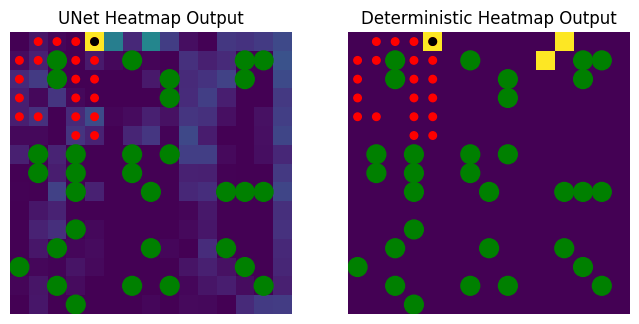

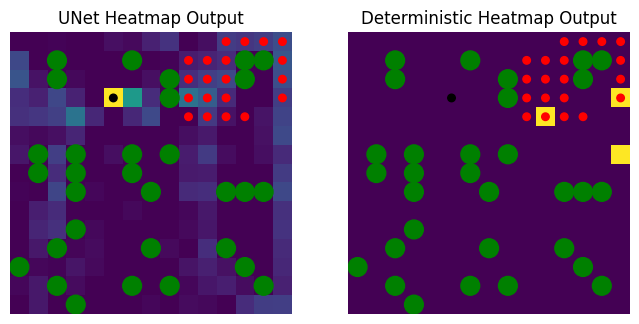

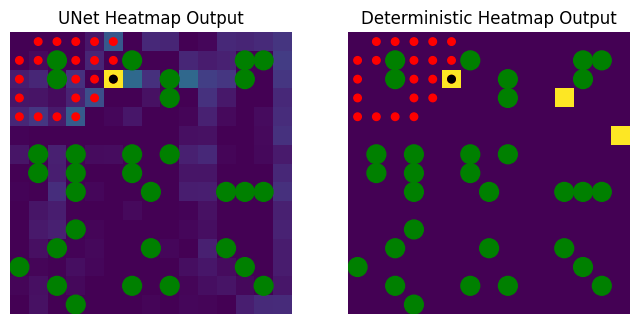

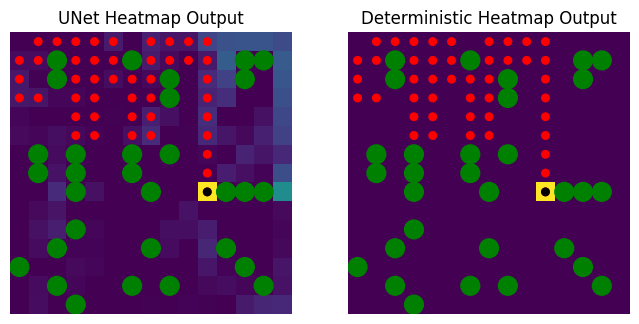

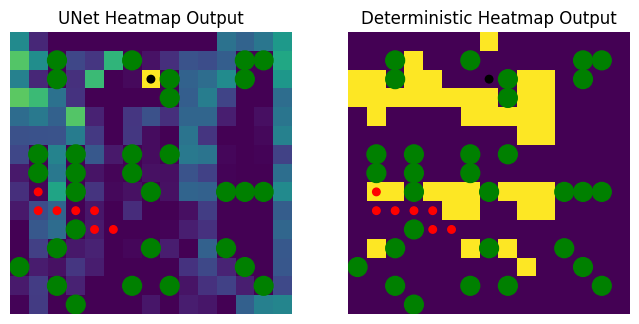

1        3.088323e+00   2.602709e+00


 64%|██████▍   | 112/175 [00:07<00:04, 14.22it/s]


KeyboardInterrupt: 

In [41]:
model_2_current, loss_dict = train_model(
    train_data = train_data_current_2,
    test_data = test_data_current_2,
    visualize_data = visualize_data_current_2,
    model = UNet(32, bias=True),
    loss_fn = nn.CrossEntropyLoss(),
    epochs=10,
    lr=1e-4,
    print_every=1,
    visualize_images=5,
    batch_size=256
)

# Save UNet model
# torch.save(model_2_current.state_dict(), 'model_2_current_weights.pth')

## Predict next position based on the mapping of sequence of movement
1. Use the current position prediction to allign the mapping of movement to the current position <br>
This makes the code easier

2. Train the UNet on mappings of sequences of movement with the last position truncated and used as label

In [46]:
random_seed = 42

paths_truncated = [path[:-1] for path in paths]

masks_next = path_to_mask(paths_truncated)

train_inputs, test_inputs, train_labels, test_labels = train_test_split(
    masks_next, final_positions, test_size=percentage, random_state=random_seed, shuffle=False
)
_, _, train_paths, test_paths = train_test_split(
    masks_next, paths_truncated, test_size=percentage, random_state=random_seed, shuffle=False
)

train_data_next = SequenceMapped(train_inputs, train_labels, board, device)
test_data_next = SequenceMappedTest(test_inputs, test_labels, board, test_paths, device)

In [47]:
model_next, loss_dict_next = train_model(
    train_data = train_data_next,
    test_data = test_data_next,
    model = UNet(32, bias=True),
    loss_fn = nn.CrossEntropyLoss(),
    epochs=10,
    lr=1e-4,
    print_every=1,
    visualize_images=2,
    batch_size=256
)


AttributeError: partially initialized module 'torch._dynamo' has no attribute 'config' (most likely due to a circular import)

## Evaluating

  0%|          | 0/10000 [00:00<?, ?it/s]c:\Users\20213032\OneDrive - TU Eindhoven\Documents\TUe\Y5\Q3\BEP\.venv\Lib\site-packages\torch\utils\_device.py:104: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
100%|██████████| 10000/10000 [02:30<00:00, 66.38it/s]


Method Deterministic has mean + std < 1 at path length 30 with value=np.float64(0.8899999999999999)
Method Deterministic has mean + std < 1 at path length 31 with value=np.float64(0.65)
Method Deterministic has mean + std < 1 at path length 32 with value=np.float64(0.45)
Method Deterministic has mean + std < 1 at path length 33 with value=np.float64(0.31999999999999995)
Method Deterministic has mean + std < 1 at path length 34 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 35 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 36 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 37 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 38 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 39 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 40 with value=np.float64(0.0)
Method Deterministic has mean + 

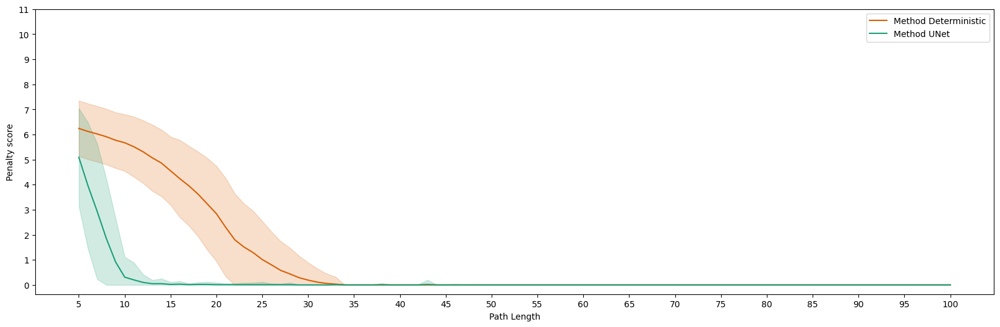

In [23]:
# UNet trained on Agent 2 tested on Agent 2
test_data_loader = DataLoader(visualize_data_current_2, batch_size=1, shuffle=True, generator=torch.Generator(device=device))
compare_UNet_to_Deterministic(test_data_loader, model_2_current)

  0%|          | 0/10000 [00:00<?, ?it/s]c:\Users\20213032\OneDrive - TU Eindhoven\Documents\TUe\Y5\Q3\BEP\.venv\Lib\site-packages\torch\utils\_device.py:104: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
100%|██████████| 10000/10000 [02:35<00:00, 64.30it/s]


Method Deterministic has mean + std < 1 at path length 30 with value=np.float64(0.8899999999999999)
Method Deterministic has mean + std < 1 at path length 31 with value=np.float64(0.65)
Method Deterministic has mean + std < 1 at path length 32 with value=np.float64(0.45)
Method Deterministic has mean + std < 1 at path length 33 with value=np.float64(0.31999999999999995)
Method Deterministic has mean + std < 1 at path length 34 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 35 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 36 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 37 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 38 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 39 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 40 with value=np.float64(0.0)
Method Deterministic has mean + 

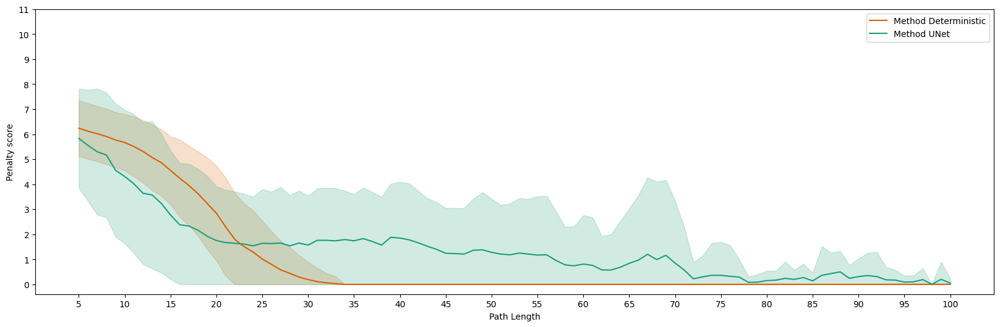

In [14]:
# UNet trained on Agent 2 self_play test on Agent 2
test_data_loader = DataLoader(visualize_data_current_2, batch_size=1, shuffle=True, generator=torch.Generator(device=device))
compare_UNet_to_Deterministic(test_data_loader, model_2_self_play)

  0%|          | 0/10000 [00:00<?, ?it/s]c:\Users\20213032\OneDrive - TU Eindhoven\Documents\TUe\Y5\Q3\BEP\.venv\Lib\site-packages\torch\utils\_device.py:104: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
100%|██████████| 10000/10000 [02:34<00:00, 64.77it/s]


Method Deterministic has mean + std < 1 at path length 30 with value=np.float64(0.89)
Method Deterministic has mean + std < 1 at path length 31 with value=np.float64(0.7200000000000001)
Method Deterministic has mean + std < 1 at path length 32 with value=np.float64(0.66)
Method Deterministic has mean + std < 1 at path length 33 with value=np.float64(0.63)
Method Deterministic has mean + std < 1 at path length 34 with value=np.float64(0.5)
Method Deterministic has mean + std < 1 at path length 35 with value=np.float64(0.52)
Method Deterministic has mean + std < 1 at path length 36 with value=np.float64(0.51)
Method Deterministic has mean + std < 1 at path length 37 with value=np.float64(0.5)
Method Deterministic has mean + std < 1 at path length 38 with value=np.float64(0.4)
Method Deterministic has mean + std < 1 at path length 39 with value=np.float64(0.41000000000000003)
Method Deterministic has mean + std < 1 at path length 40 with value=np.float64(0.44)
Method Deterministic has mea

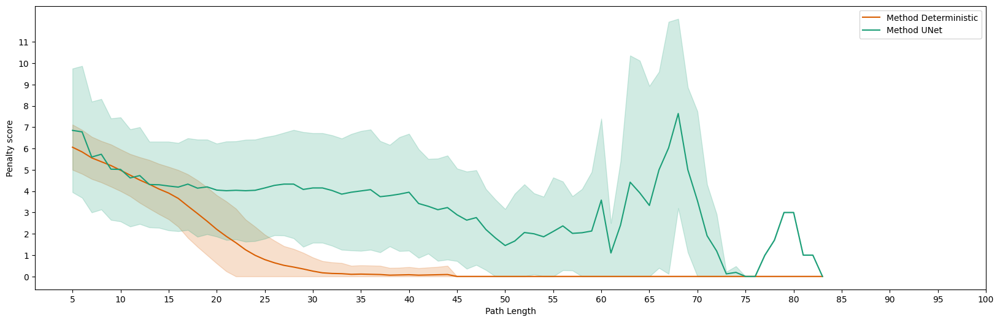

In [24]:
# UNet trained on Agent 2 tested on Agent 4
test_data_loader = DataLoader(visualize_data_current_4, batch_size=1, shuffle=True, generator=torch.Generator(device=device))
compare_UNet_to_Deterministic(test_data_loader, model_2_current)


  0%|          | 0/10000 [00:00<?, ?it/s]c:\Users\20213032\OneDrive - TU Eindhoven\Documents\TUe\Y5\Q3\BEP\.venv\Lib\site-packages\torch\utils\_device.py:104: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
100%|██████████| 10000/10000 [02:33<00:00, 65.20it/s]


Method Deterministic has mean + std < 1 at path length 30 with value=np.float64(0.89)
Method Deterministic has mean + std < 1 at path length 31 with value=np.float64(0.7200000000000001)
Method Deterministic has mean + std < 1 at path length 32 with value=np.float64(0.66)
Method Deterministic has mean + std < 1 at path length 33 with value=np.float64(0.63)
Method Deterministic has mean + std < 1 at path length 34 with value=np.float64(0.5)
Method Deterministic has mean + std < 1 at path length 35 with value=np.float64(0.52)
Method Deterministic has mean + std < 1 at path length 36 with value=np.float64(0.51)
Method Deterministic has mean + std < 1 at path length 37 with value=np.float64(0.5)
Method Deterministic has mean + std < 1 at path length 38 with value=np.float64(0.4)
Method Deterministic has mean + std < 1 at path length 39 with value=np.float64(0.41000000000000003)
Method Deterministic has mean + std < 1 at path length 40 with value=np.float64(0.44)
Method Deterministic has mea

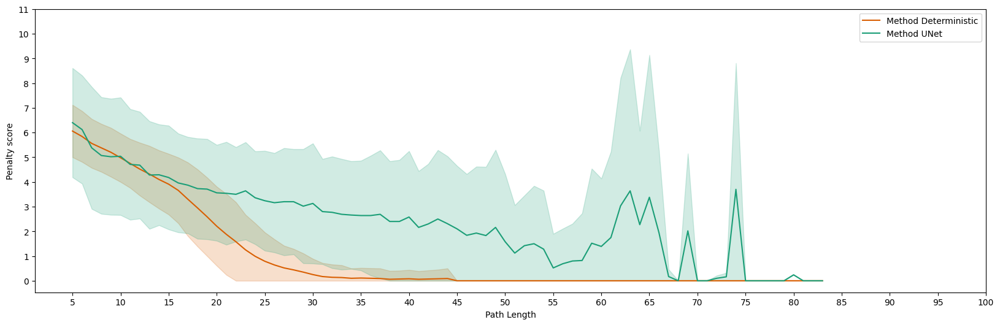

In [16]:
test_data_loader = DataLoader(visualize_data_current_4, batch_size=1, shuffle=True, generator=torch.Generator(device=device))
compare_UNet_to_Deterministic(test_data_loader, model_2_self_play)

# Agent 4

In [15]:
train_data_current_4, test_data_current_4, visualize_data_current_4 = make_datasets(hybrid_paths, hybrid_sequences_standardized, board)

len(sequences)=553909, len(subdivided_paths)=553909
Masks created
Masks standardized
Final positions calculated
Train test split done
Paths split done
Datasets created
Allocated memory: 2920044544


In [33]:
def determenistic_sub_finding(mask, board):
    filter, sub_pos = mask_to_filter(mask)

    x_shape, y_shape = filter.shape
    X_shape, Y_shape = board.shape
    x_out, y_out = X_shape - x_shape + 1, Y_shape - y_shape + 1

    big_matrix = torch.tensor(board).view(1, 1, X_shape, Y_shape).float()
    filter = filter.view(1, 1, x_shape, y_shape).float()

    output = F.conv2d(big_matrix, filter, stride=1, padding=0)

    print("Filter sum")
    print(filter.sum())
    print("Output")
    print(output)
    print("Filter")
    print(filter)

    output = torch.where(output == filter.sum(), 1, 0) 
    output = output / output.sum()

    flattened_output = output.flatten()
    flat_matrix = torch.zeros((X_shape * Y_shape))
    for position in range(x_out * y_out):
        value = flattened_output[position]
        if value > 0:
            x_smaller, y_smaller = position // y_out, position % y_out
            adjusted_position = x_smaller * 15 + y_smaller
            flat_matrix[adjusted_position + sub_pos] = value

    matrix = flat_matrix.view(X_shape, Y_shape)
    return matrix

In [15]:
# Load model
model_4_current = UNet(32, bias=True)
model_4_current.load_state_dict(torch.load('model_4_current_weights.pth'))
model_4_current.eval()
print("Model loaded")

Model loaded


## Predict current position

Epoch    Train RMSRE      Test RMSRE


100%|██████████| 2125/2125 [02:53<00:00, 12.22it/s]
c:\Users\20213032\OneDrive - TU Eindhoven\Documents\TUe\Y5\Q3\BEP\.venv\Lib\site-packages\torch\utils\_device.py:104: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


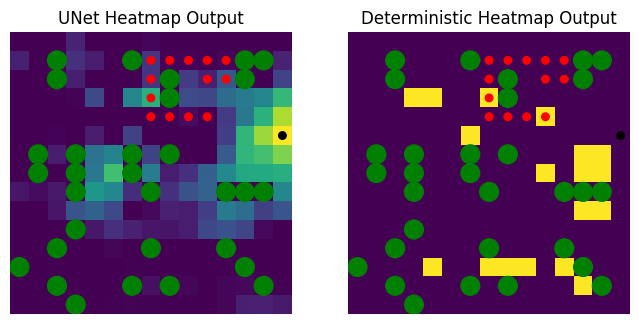

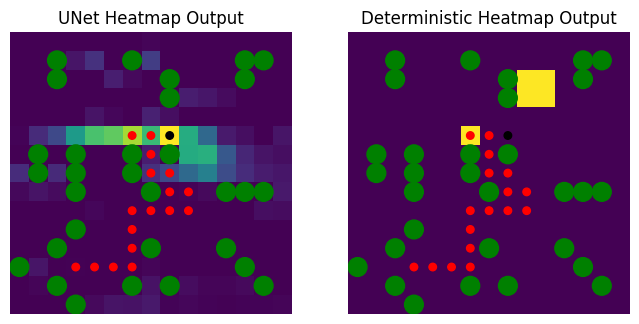

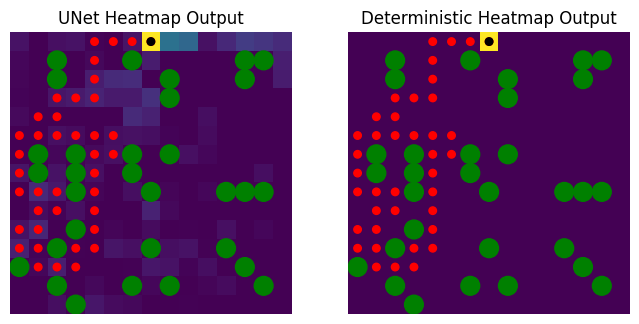

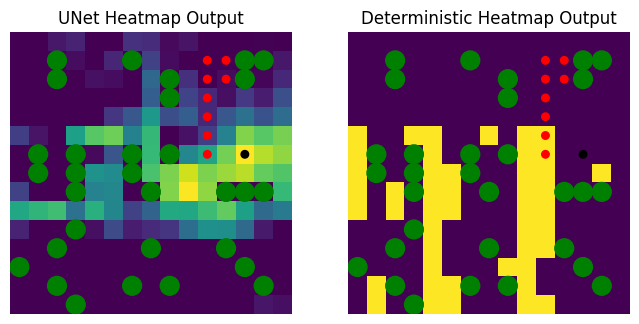

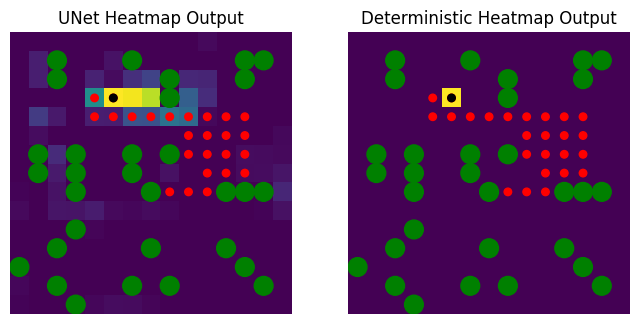

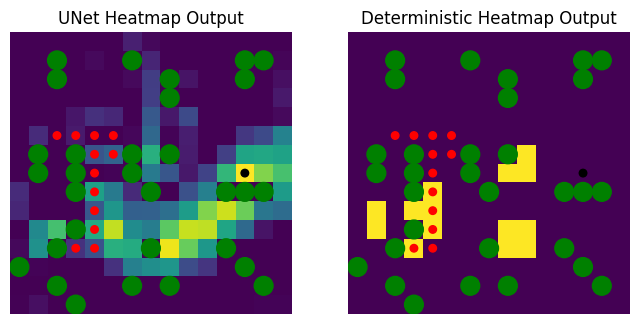

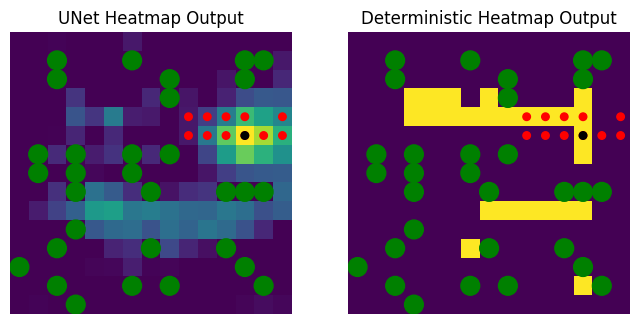

1        3.105074e+00   2.182931e+00


100%|██████████| 2125/2125 [04:12<00:00,  8.42it/s]


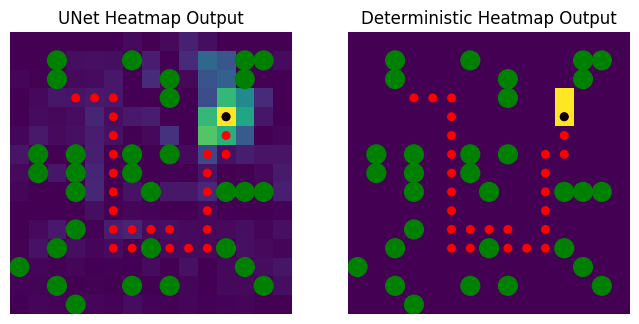

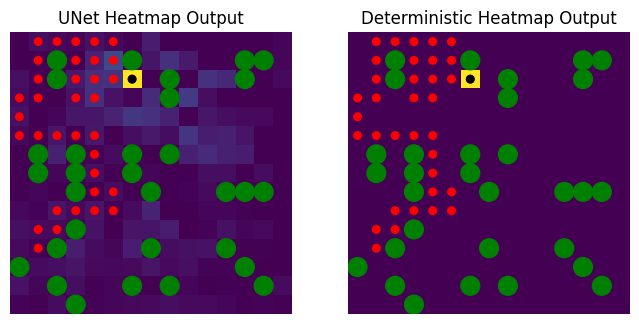

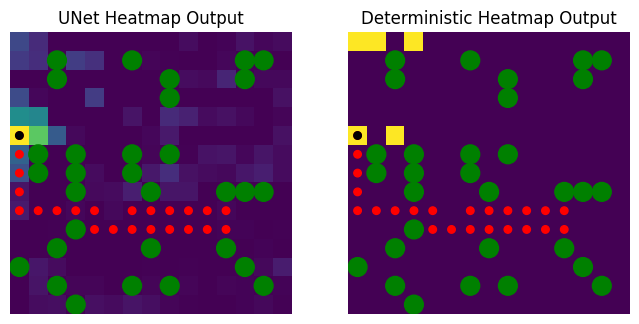

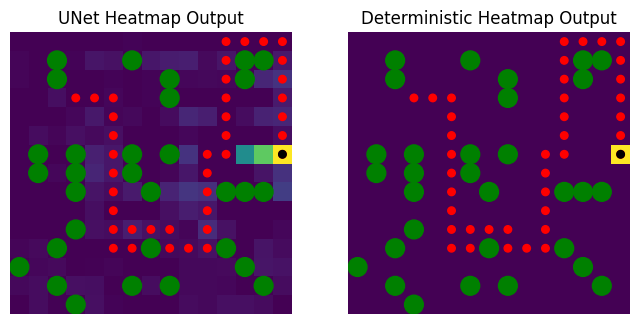

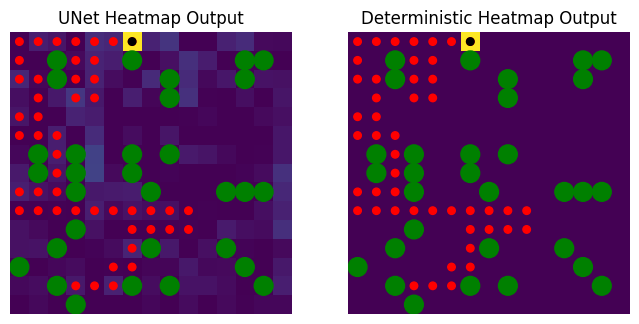

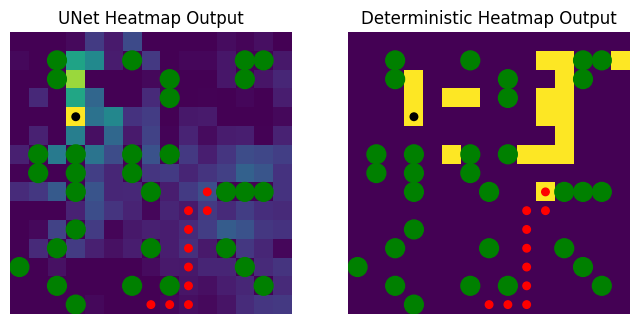

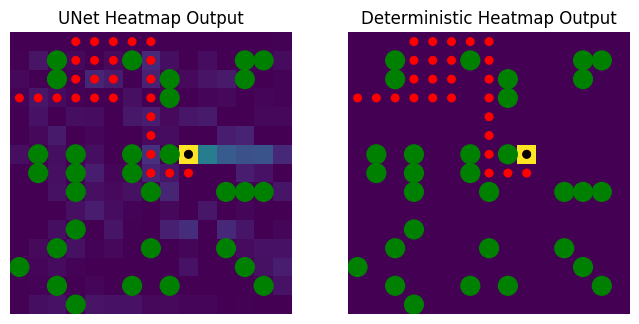

2        1.530032e+00   1.240762e+00


100%|██████████| 2125/2125 [04:27<00:00,  7.93it/s]


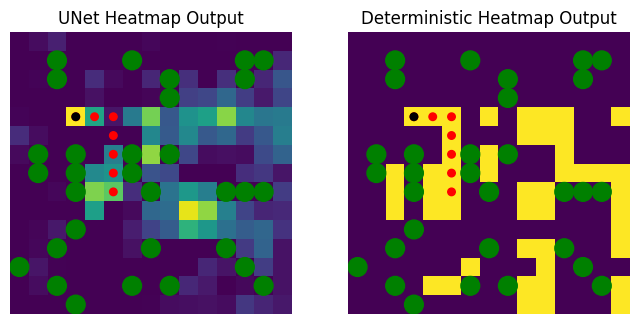

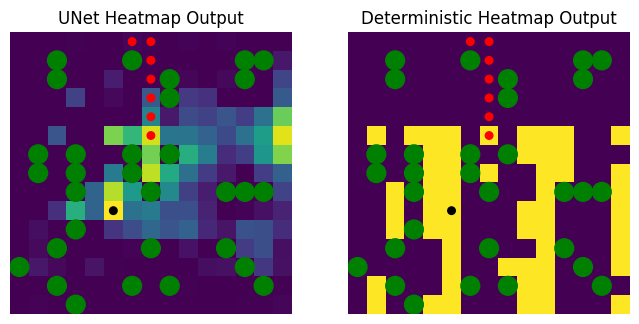

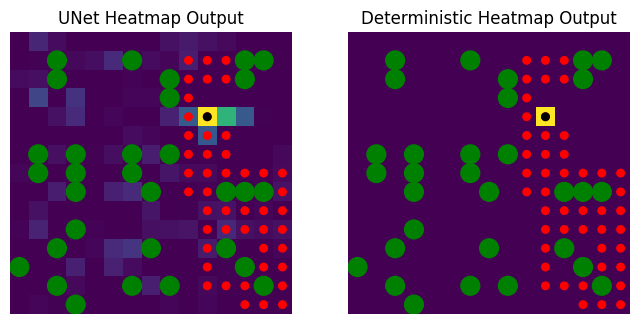

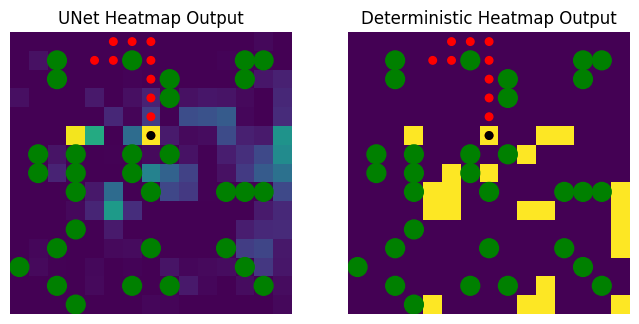

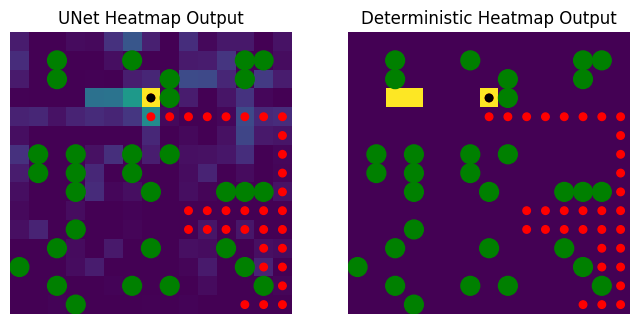

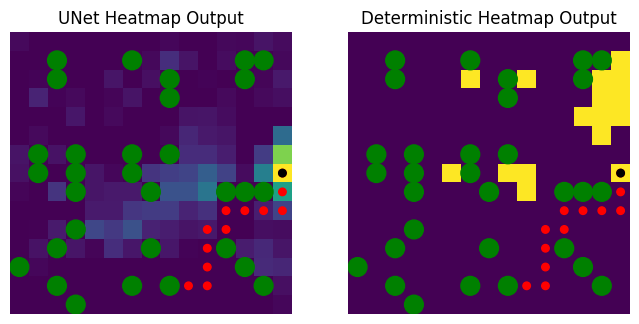

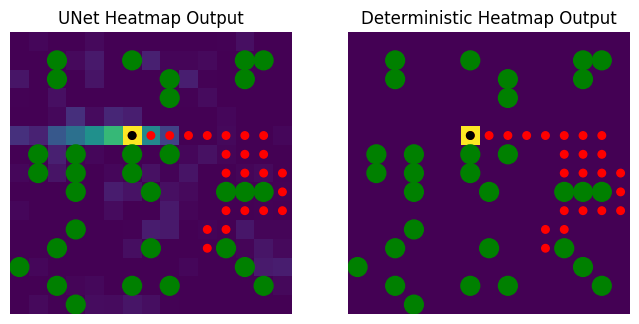

3        9.388832e-01   7.799006e-01


100%|██████████| 2125/2125 [04:35<00:00,  7.71it/s]


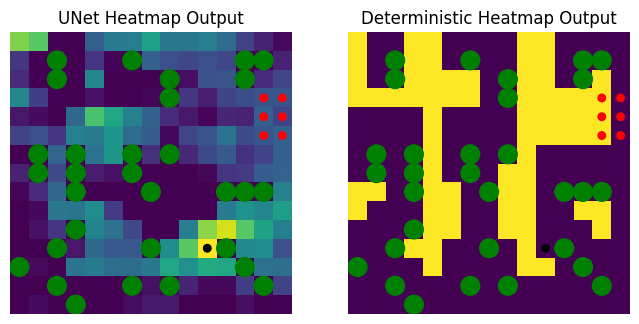

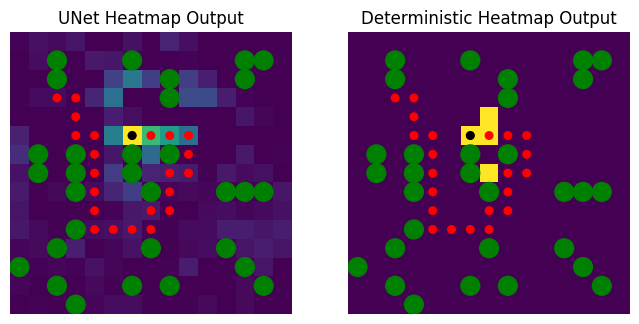

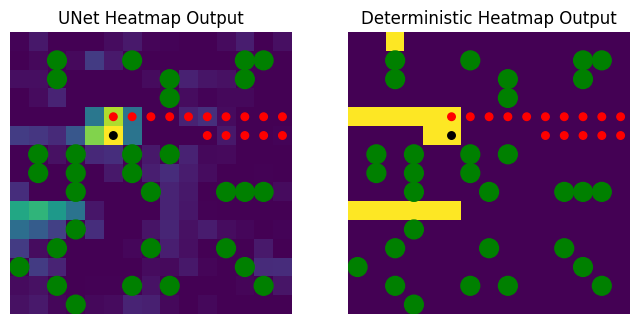

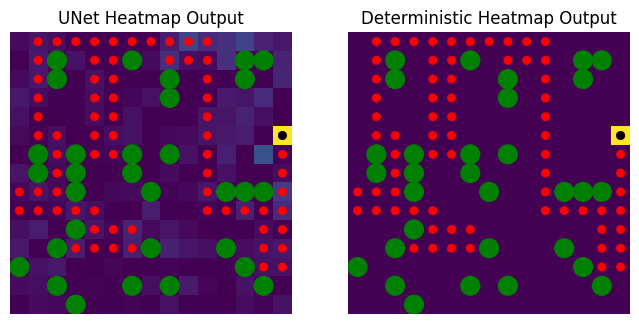

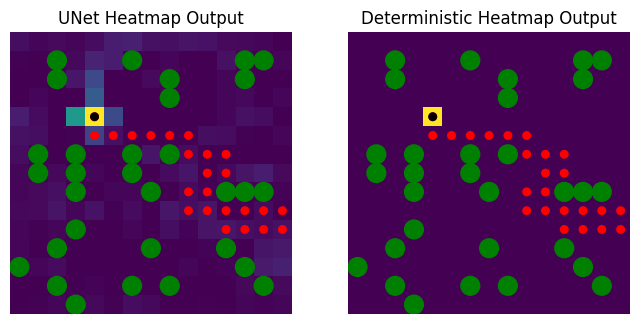

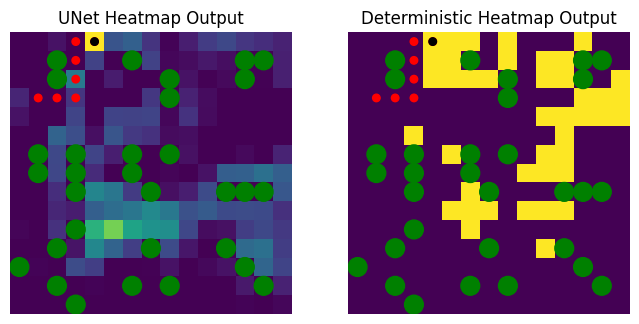

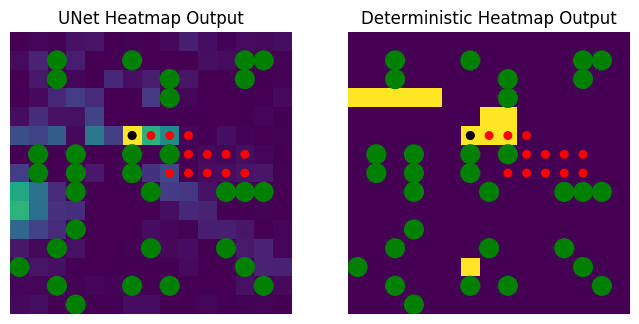

4        6.669293e-01   6.239105e-01


100%|██████████| 2125/2125 [03:41<00:00,  9.61it/s]


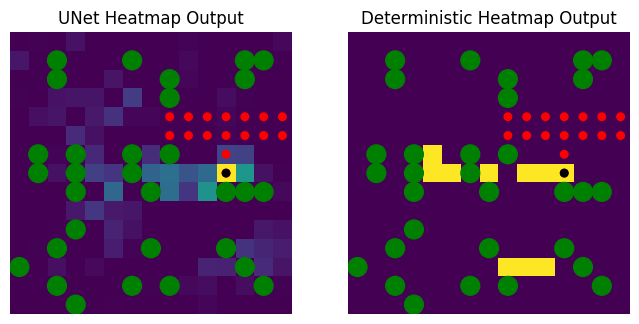

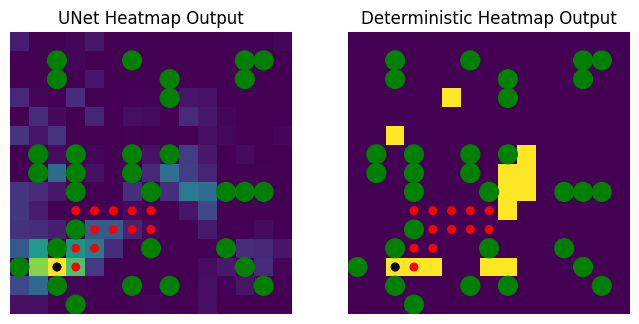

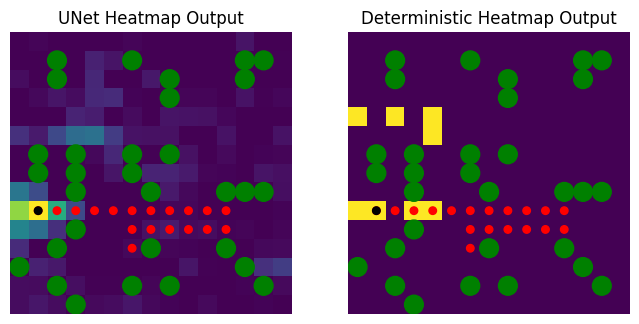

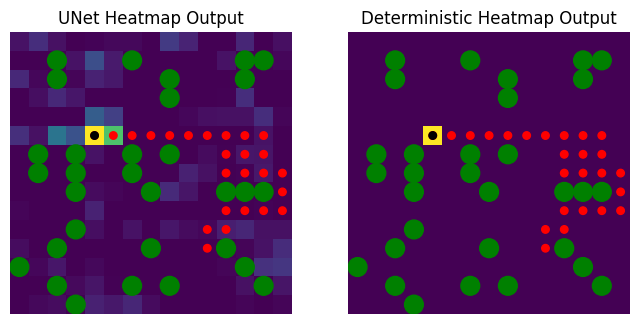

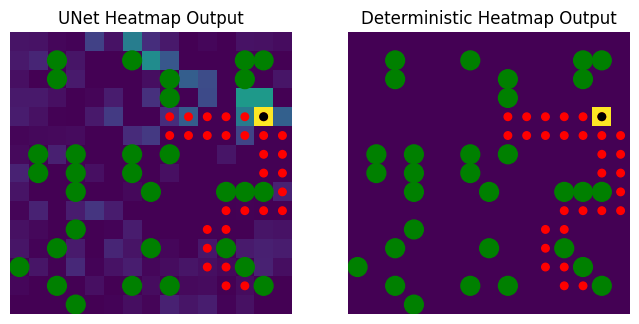

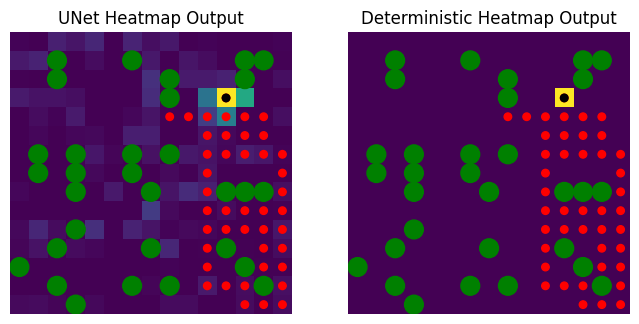

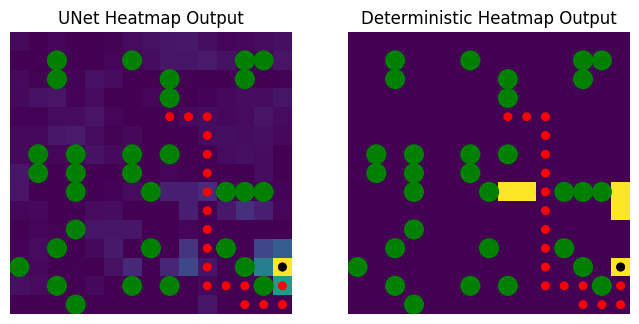

5        5.239692e-01   4.587873e-01


100%|██████████| 2125/2125 [03:39<00:00,  9.69it/s]


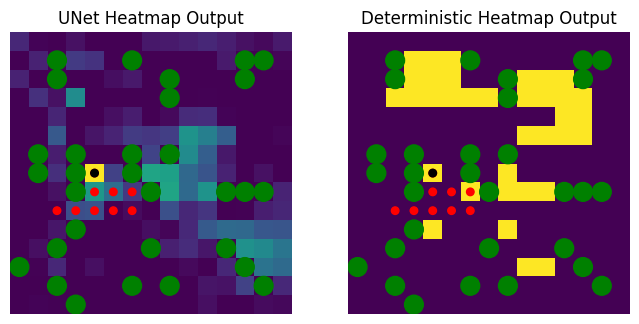

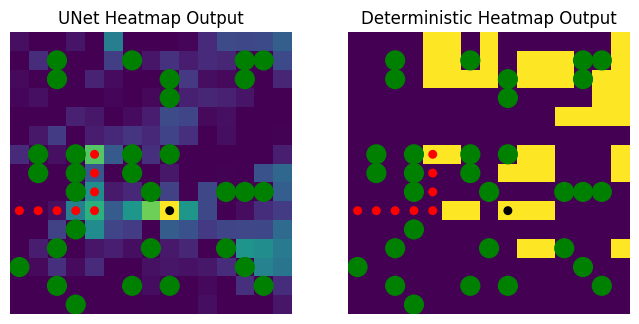

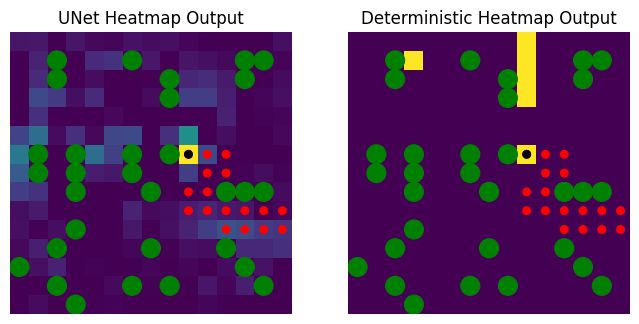

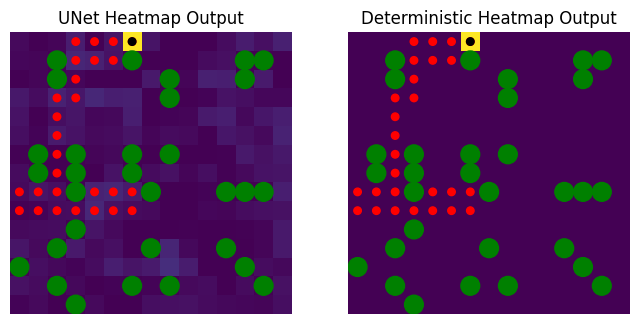

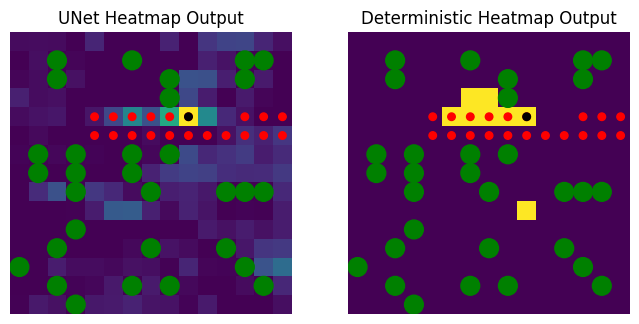

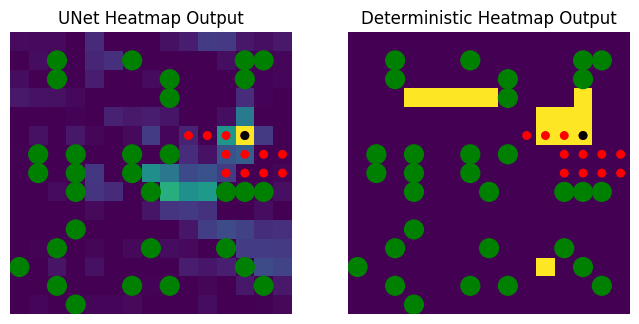

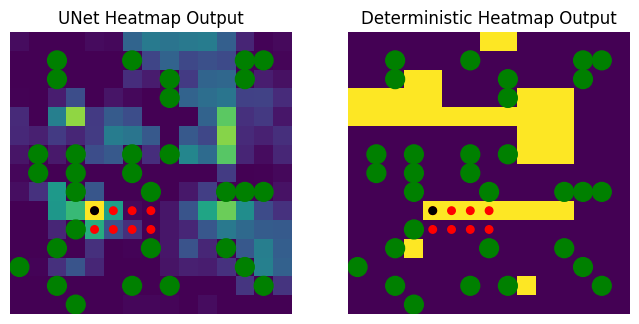

6        4.349738e-01   4.129710e-01


100%|██████████| 2125/2125 [03:52<00:00,  9.15it/s]


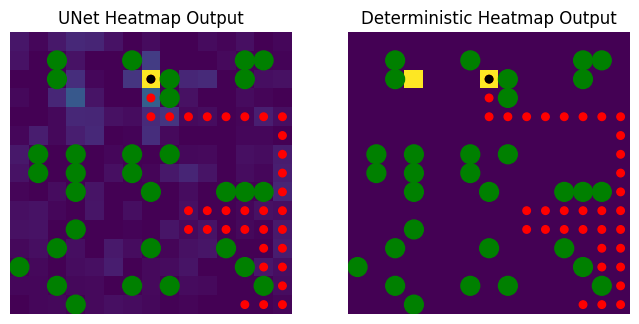

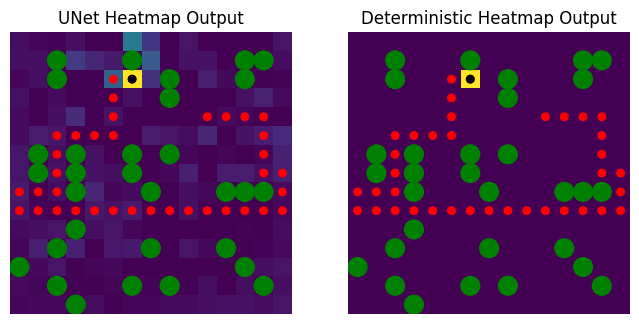

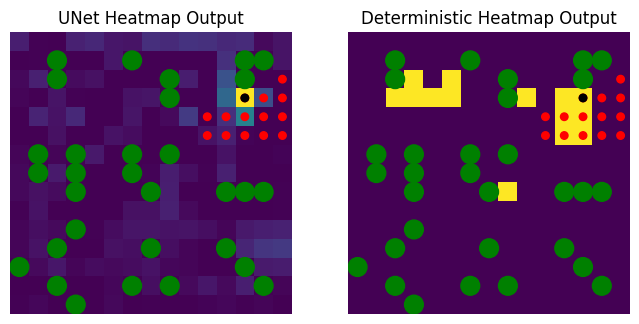

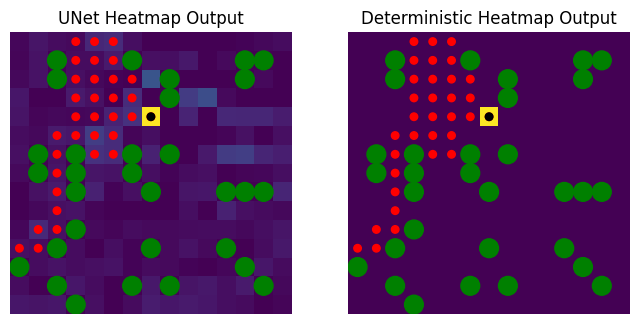

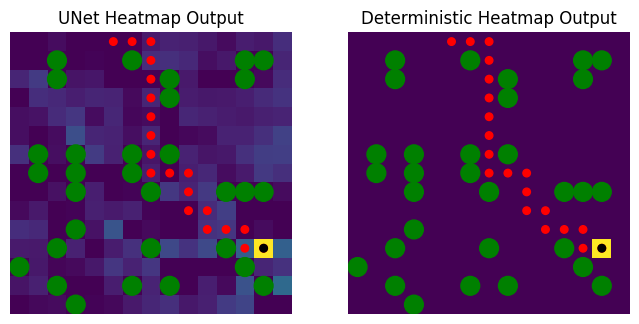

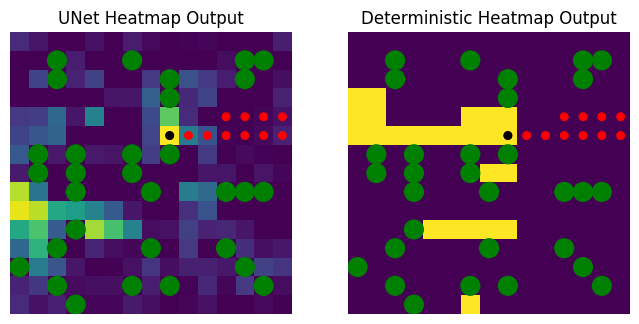

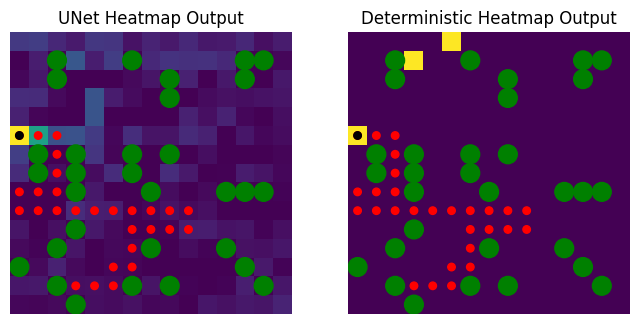

7        3.844524e-01   3.725498e-01


100%|██████████| 2125/2125 [03:45<00:00,  9.44it/s]


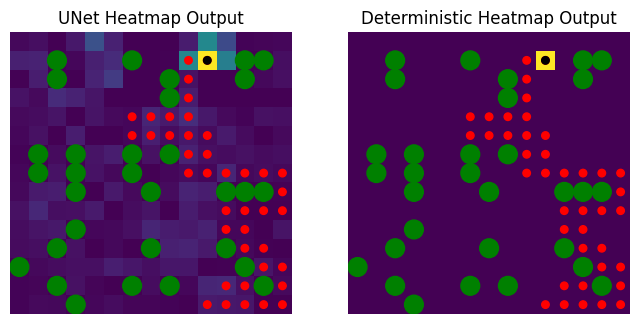

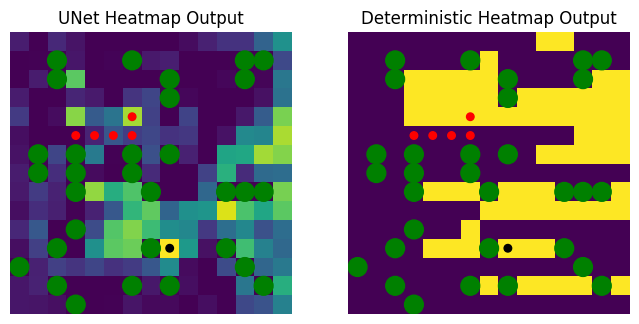

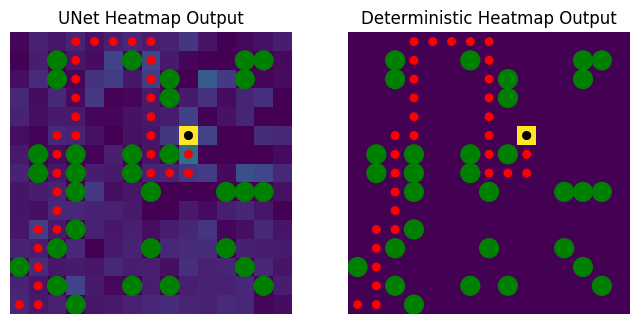

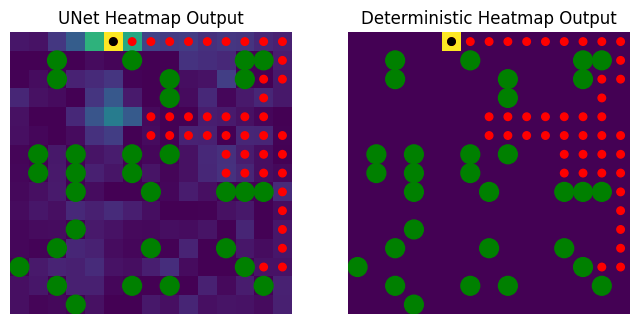

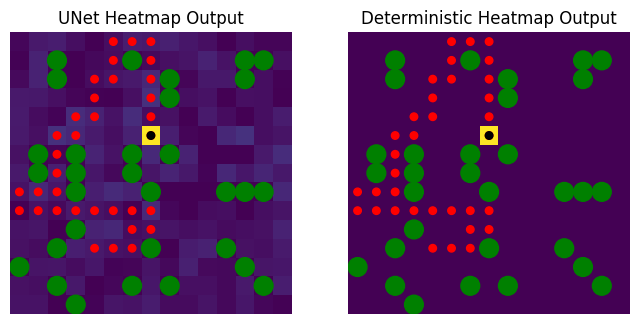

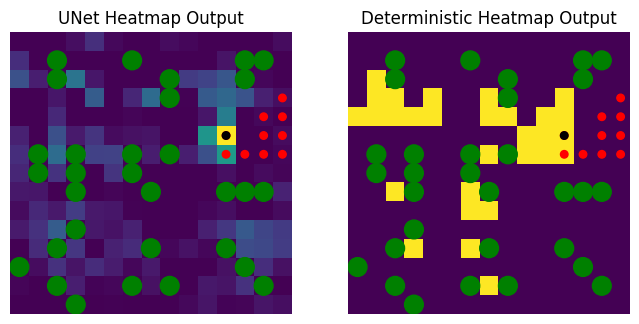

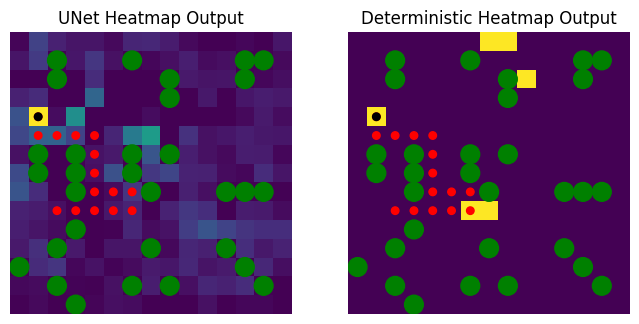

8        3.489925e-01   3.164696e-01


100%|██████████| 2125/2125 [06:16<00:00,  5.64it/s]


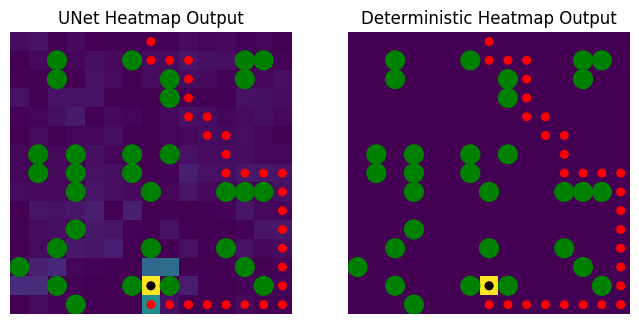

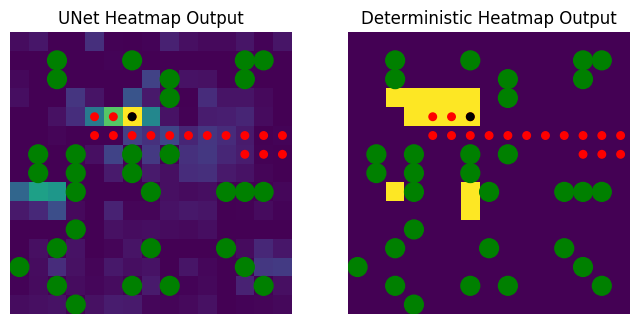

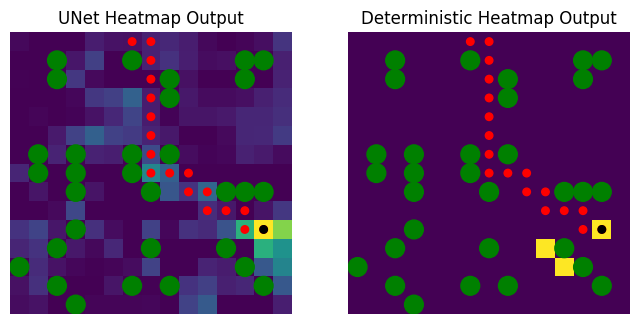

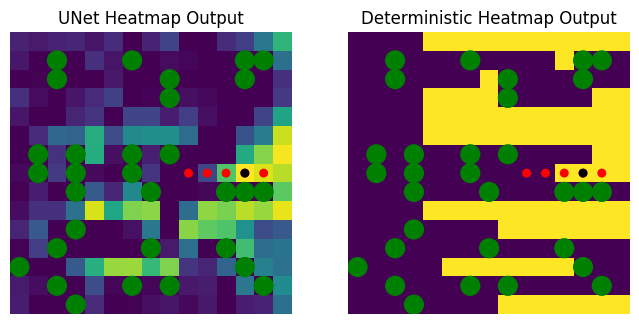

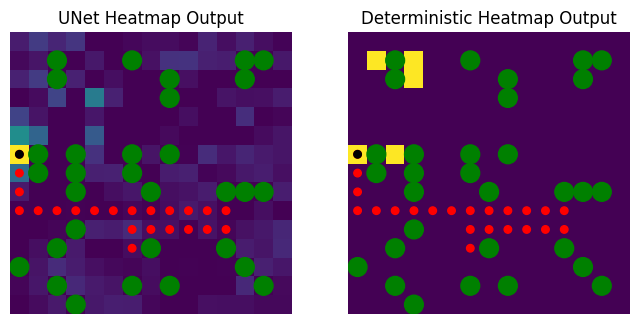

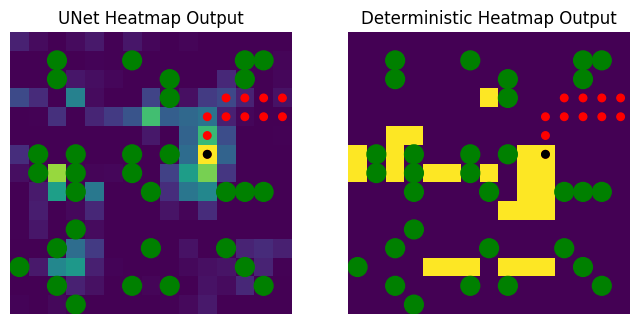

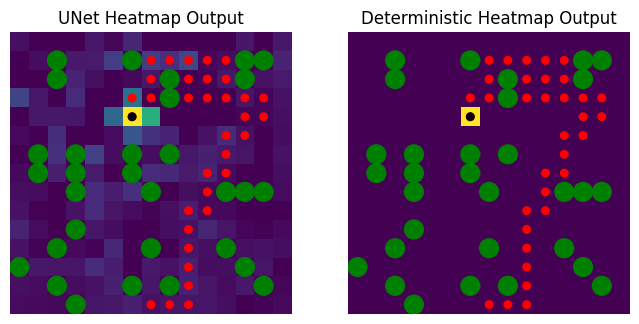

9        3.301025e-01   3.073772e-01


100%|██████████| 2125/2125 [05:39<00:00,  6.26it/s]


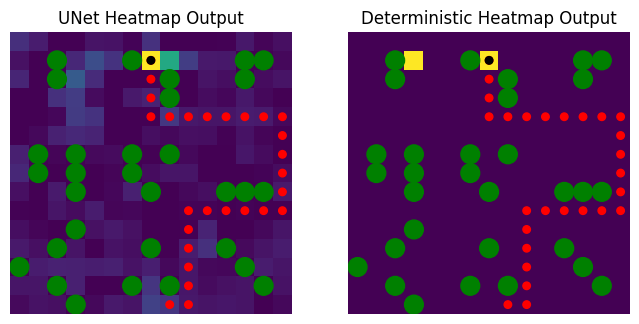

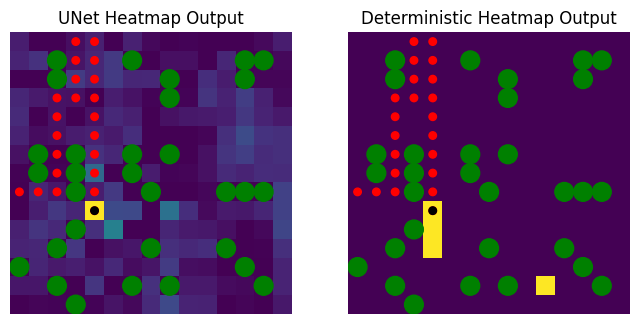

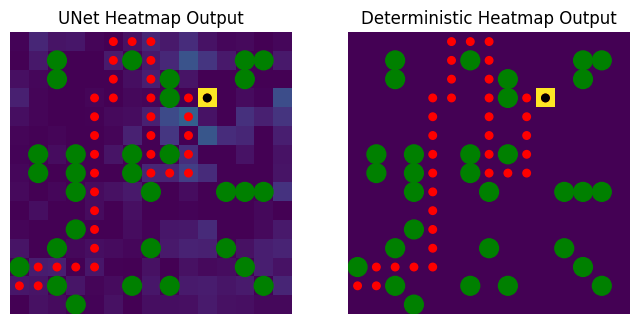

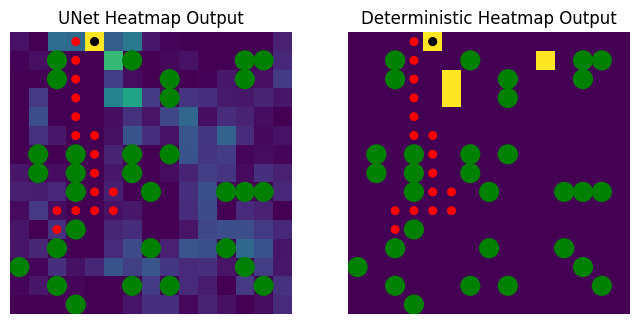

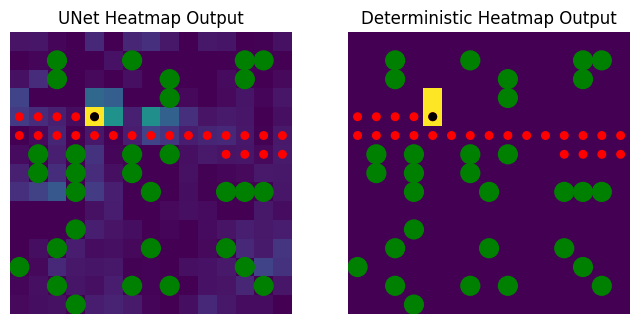

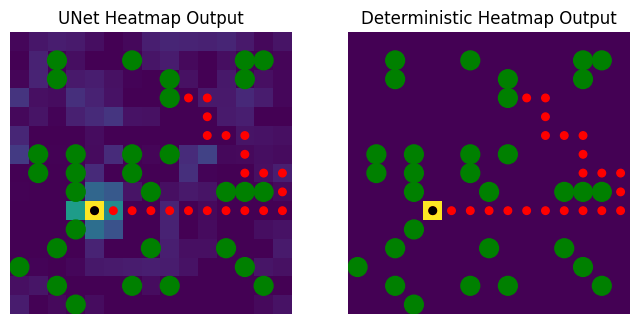

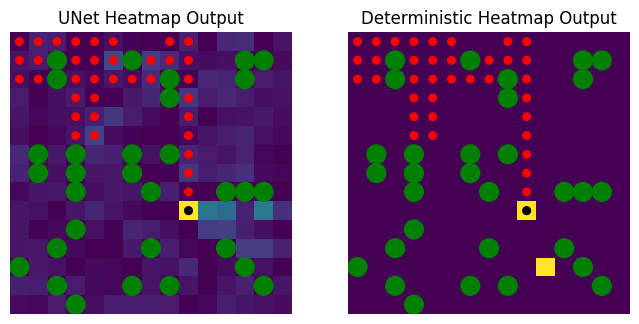

10       3.038535e-01   2.868981e-01


In [ ]:
model_4_current, loss_dict = train_model(
    train_data = train_data_current_4,
    test_data = test_data_current_4,
    visualize_data = visualize_data_current_4,
    model = UNet(32, bias=True),
    loss_fn = nn.CrossEntropyLoss(),
    epochs=10,
    lr=1e-4,
    print_every=1,
    visualize_images=5,
    batch_size=256
)

# Save UNet model
# torch.save(model_4_current.state_dict(), 'model_4_current_weights.pth')

## Evaluating

  0%|          | 0/10000 [00:00<?, ?it/s]c:\Users\20213032\OneDrive - TU Eindhoven\Documents\TUe\Y5\Q3\BEP\.venv\Lib\site-packages\torch\utils\_device.py:104: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
100%|██████████| 10000/10000 [02:29<00:00, 67.10it/s]


Method Deterministic has mean + std < 1 at path length 30 with value=np.float64(0.8899999999999999)
Method Deterministic has mean + std < 1 at path length 31 with value=np.float64(0.65)
Method Deterministic has mean + std < 1 at path length 32 with value=np.float64(0.45)
Method Deterministic has mean + std < 1 at path length 33 with value=np.float64(0.31999999999999995)
Method Deterministic has mean + std < 1 at path length 34 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 35 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 36 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 37 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 38 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 39 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 40 with value=np.float64(0.0)
Method Deterministic has mean + 

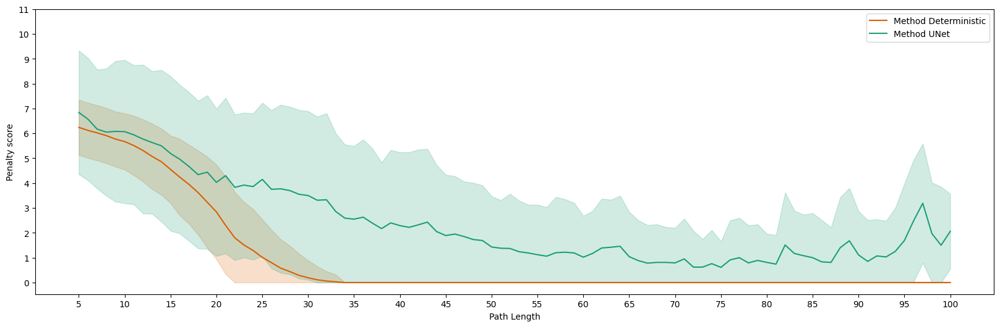

In [25]:
# UNet trained on Agent 4 tested on Agent 2
test_data_loader = DataLoader(visualize_data_current_2, batch_size=1, shuffle=True, generator=torch.Generator(device=device))
compare_UNet_to_Deterministic(test_data_loader, model_4_current)

  0%|          | 0/10000 [00:00<?, ?it/s]c:\Users\20213032\OneDrive - TU Eindhoven\Documents\TUe\Y5\Q3\BEP\.venv\Lib\site-packages\torch\utils\_device.py:104: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
100%|██████████| 10000/10000 [02:35<00:00, 64.41it/s]


Method Deterministic has mean + std < 1 at path length 30 with value=np.float64(0.89)
Method Deterministic has mean + std < 1 at path length 31 with value=np.float64(0.7200000000000001)
Method Deterministic has mean + std < 1 at path length 32 with value=np.float64(0.66)
Method Deterministic has mean + std < 1 at path length 33 with value=np.float64(0.63)
Method Deterministic has mean + std < 1 at path length 34 with value=np.float64(0.5)
Method Deterministic has mean + std < 1 at path length 35 with value=np.float64(0.52)
Method Deterministic has mean + std < 1 at path length 36 with value=np.float64(0.51)
Method Deterministic has mean + std < 1 at path length 37 with value=np.float64(0.5)
Method Deterministic has mean + std < 1 at path length 38 with value=np.float64(0.4)
Method Deterministic has mean + std < 1 at path length 39 with value=np.float64(0.41000000000000003)
Method Deterministic has mean + std < 1 at path length 40 with value=np.float64(0.44)
Method Deterministic has mea

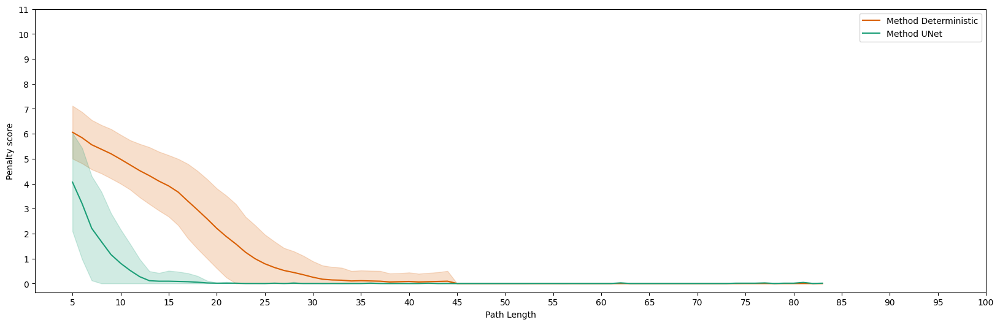

In [26]:
# UNet trained on Agent 4 tested on Agent 4
test_data_loader = DataLoader(visualize_data_current_4, batch_size=1, shuffle=True, generator=torch.Generator(device=device))
compare_UNet_to_Deterministic(test_data_loader, model_4_current)

# Agent 2 & 4

In [31]:
train_data_current_2_4 = ConcatDataset([train_data_current_2, train_data_current_4])
test_data_current_2_4 = ConcatDataset([test_data_current_2, test_data_current_4])
visualize_data_current_2_4 = ConcatDataset([visualize_data_current_2, visualize_data_current_4])
print(torch.cuda.memory_allocated())

2921234432


In [16]:
# Load model
model_2_4_current = UNet(32, bias=True)
model_2_4_current.load_state_dict(torch.load('model_2_4_current_weights.pth'))
model_2_4_current.eval()
print("Model loaded")

Model loaded


## Predicting current position

Epoch    Train RMSRE      Test RMSRE


100%|██████████| 6148/6148 [07:08<00:00, 14.35it/s]
c:\Users\20213032\OneDrive - TU Eindhoven\Documents\TUe\Y5\Q3\BEP\.venv\Lib\site-packages\torch\utils\_device.py:104: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


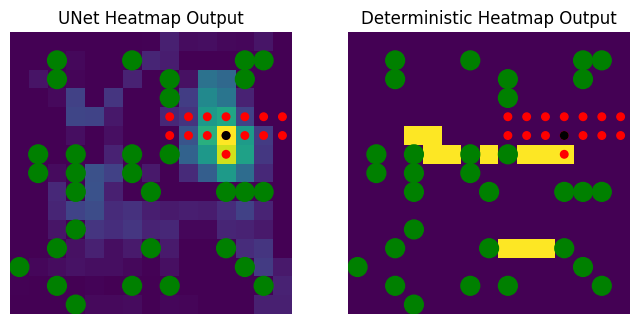

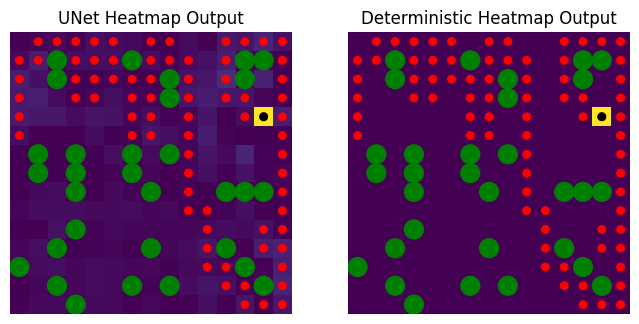

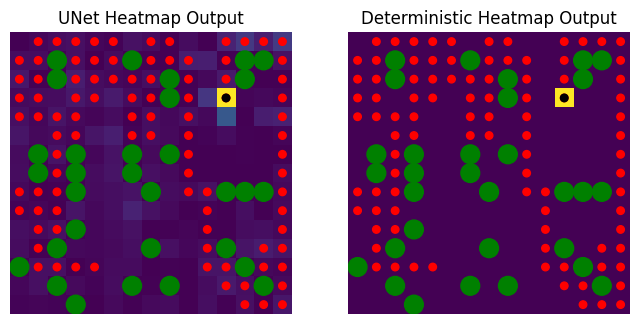

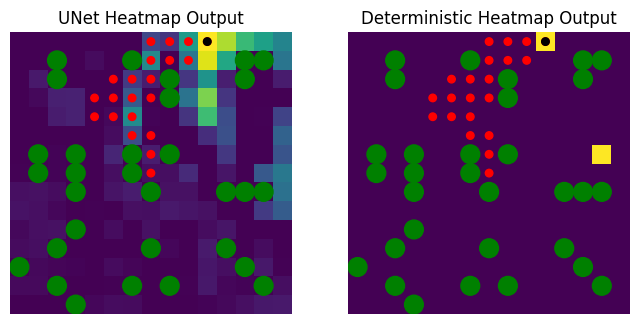

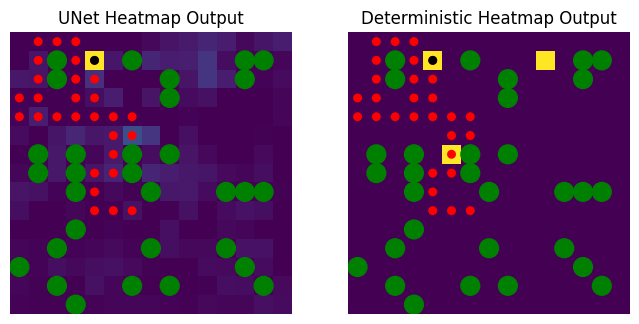

1        1.618222e+00   1.055257e+00


100%|██████████| 6148/6148 [07:18<00:00, 14.01it/s]


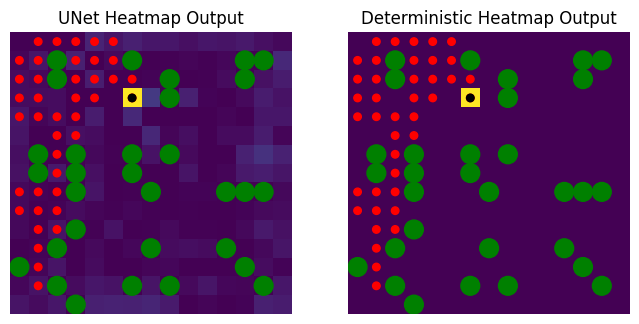

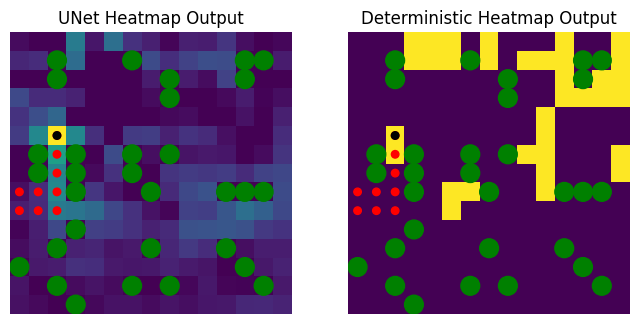

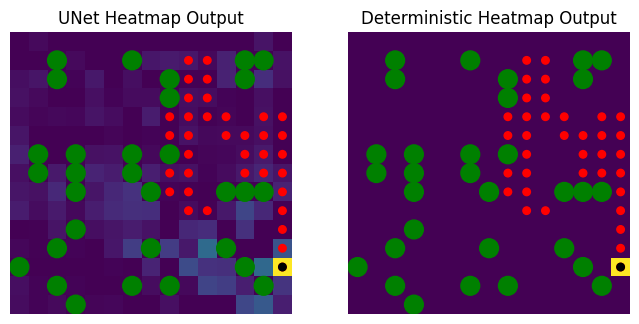

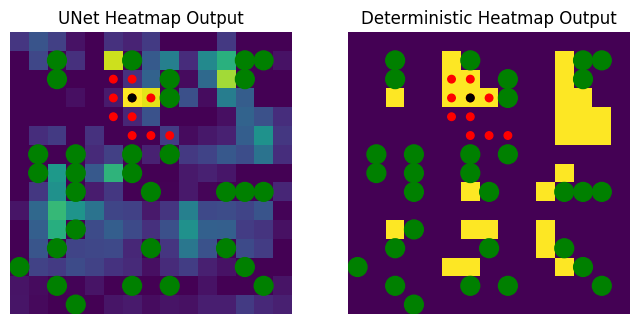

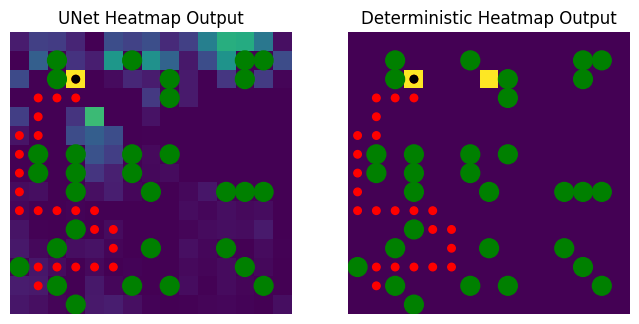

2        6.016015e-01   6.647971e-01


100%|██████████| 6148/6148 [07:08<00:00, 14.34it/s]


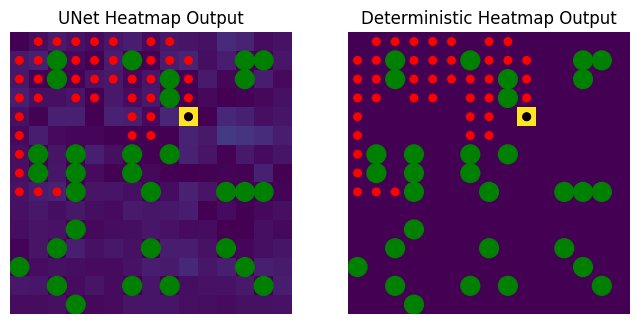

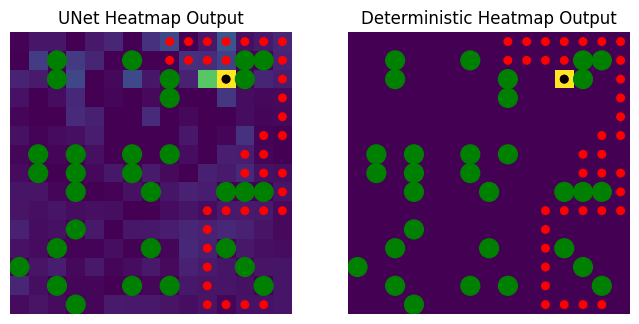

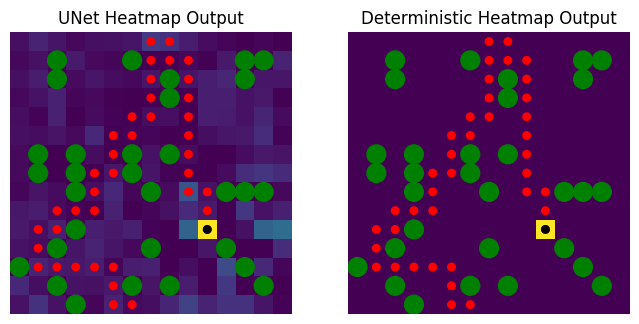

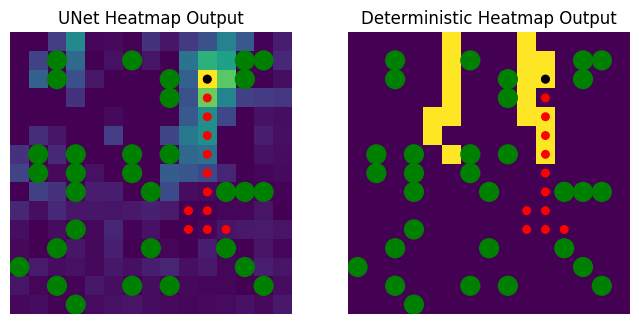

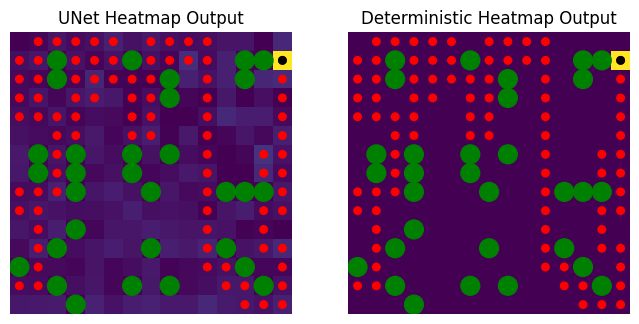

3        3.523993e-01   3.253159e-01


100%|██████████| 6148/6148 [07:13<00:00, 14.20it/s]


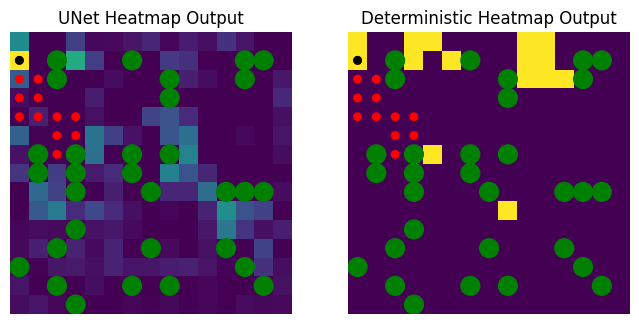

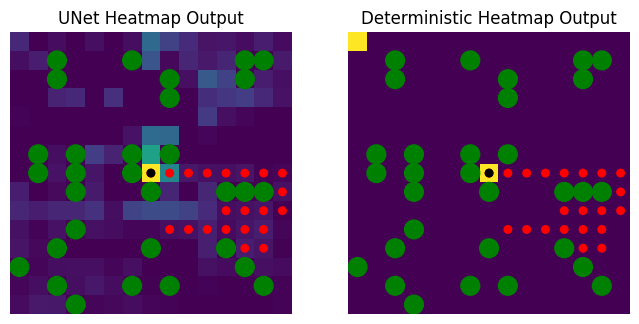

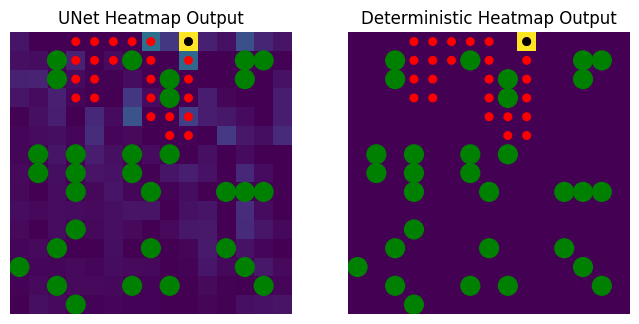

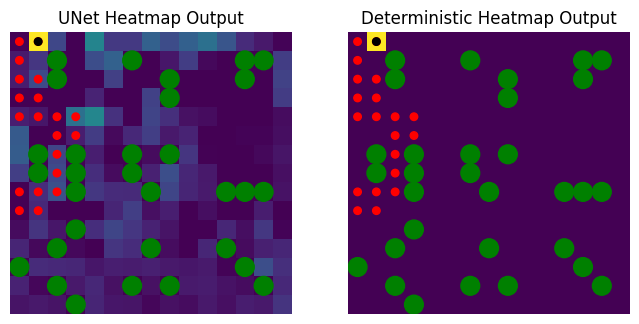

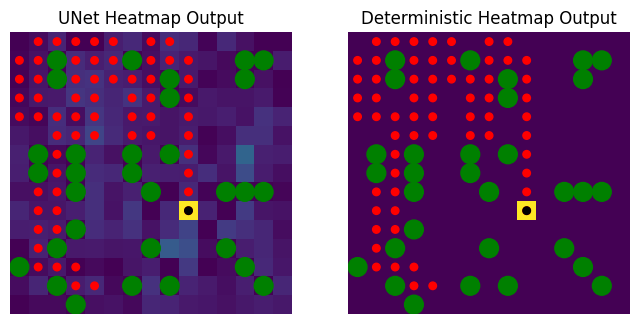

4        2.753157e-01   2.936184e-01


100%|██████████| 6148/6148 [07:17<00:00, 14.06it/s]


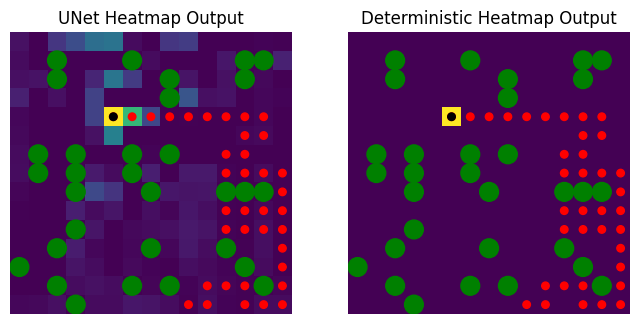

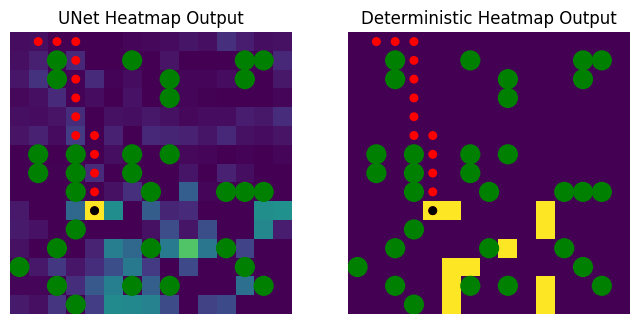

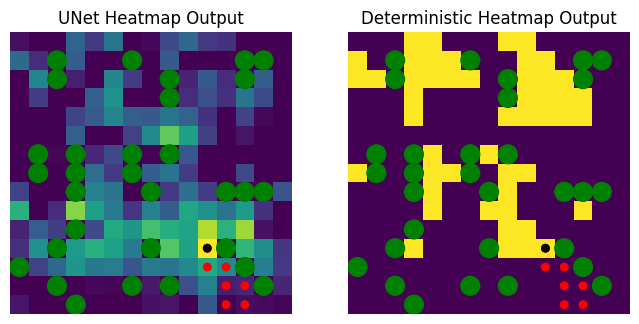

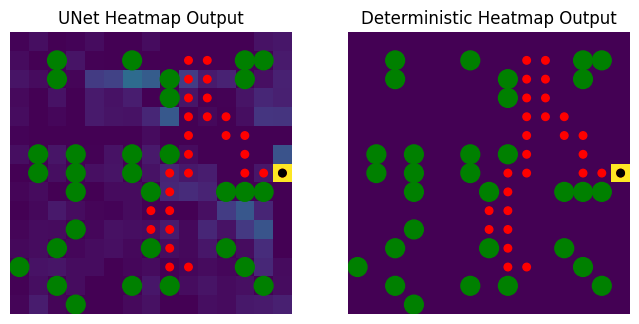

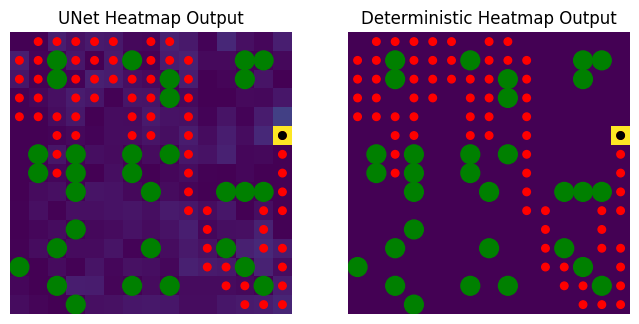

5        2.409234e-01   2.623816e-01


100%|██████████| 6148/6148 [07:11<00:00, 14.24it/s]


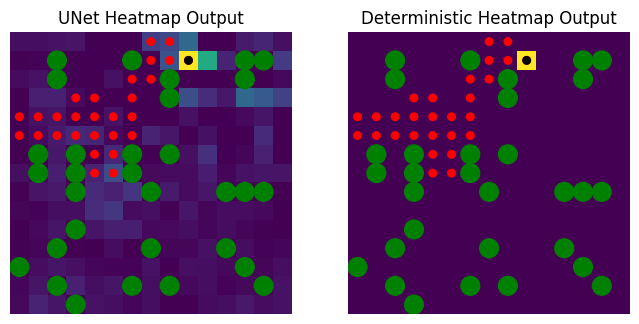

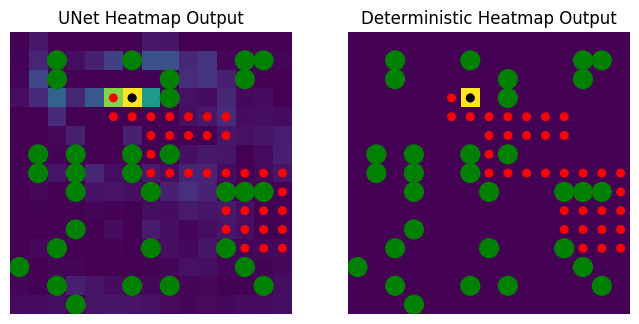

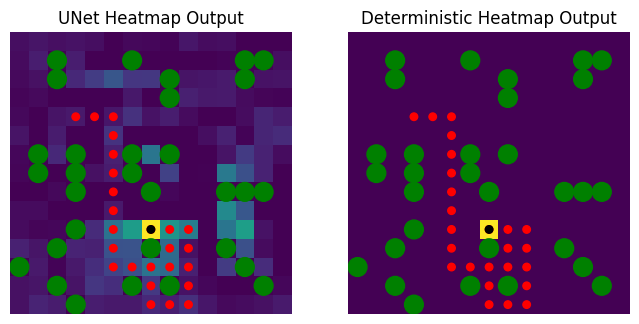

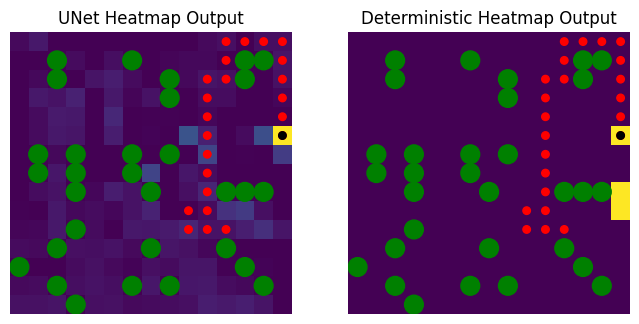

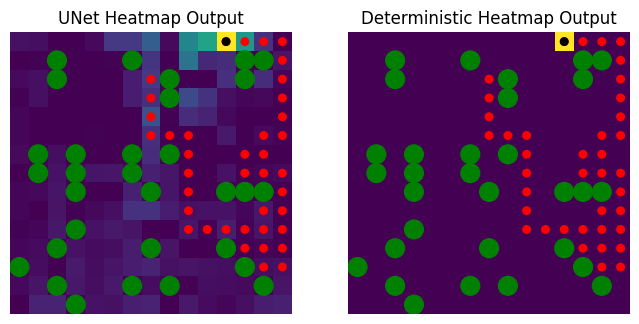

6        2.204229e-01   2.465746e-01


100%|██████████| 6148/6148 [07:11<00:00, 14.25it/s]


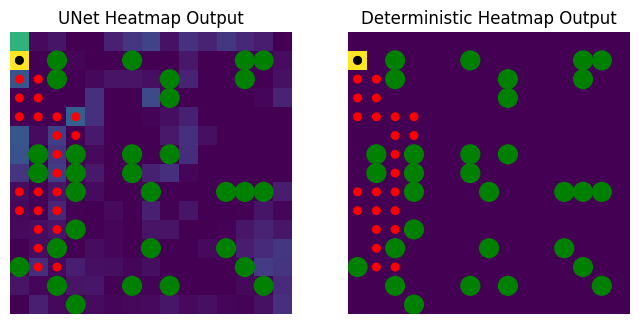

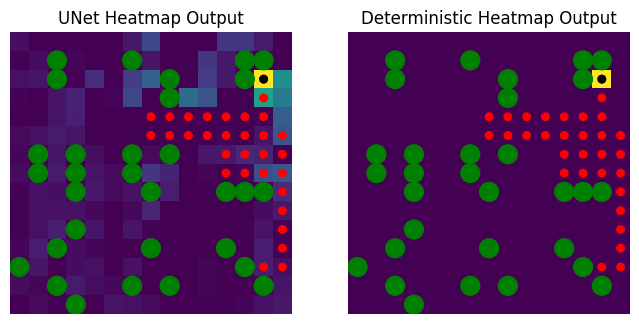

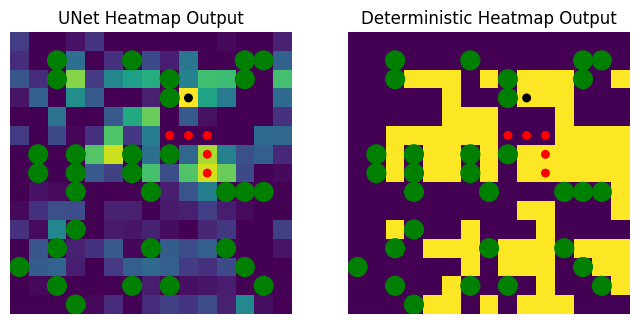

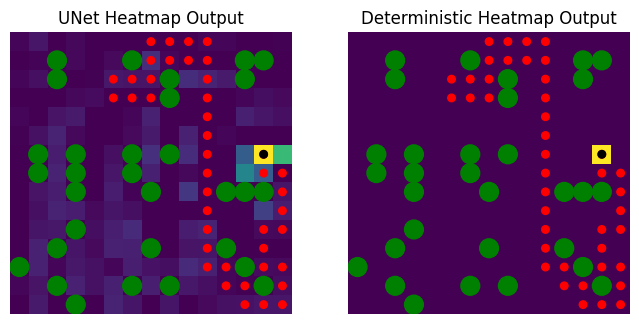

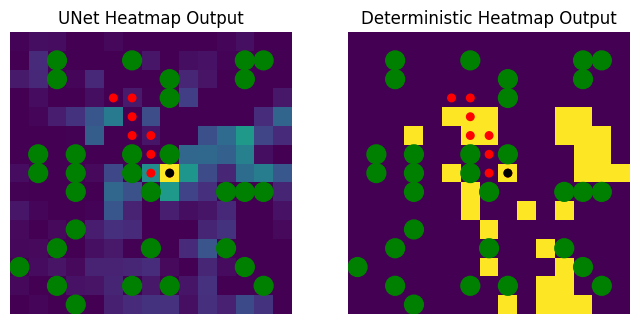

7        2.071649e-01   2.179295e-01


100%|██████████| 6148/6148 [07:11<00:00, 14.24it/s]


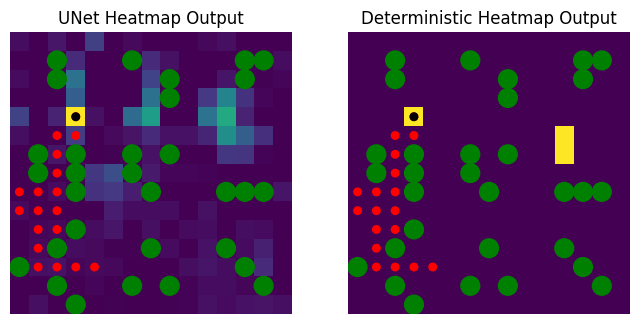

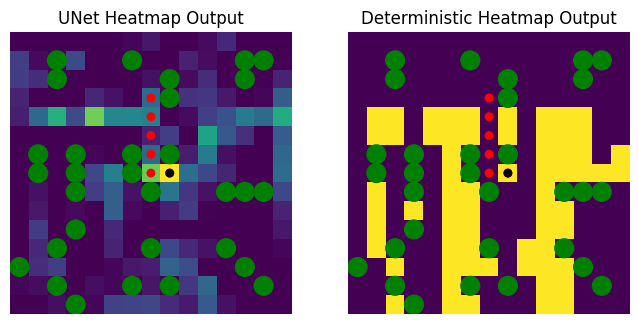

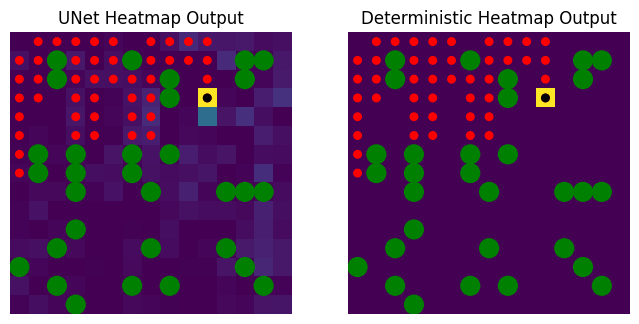

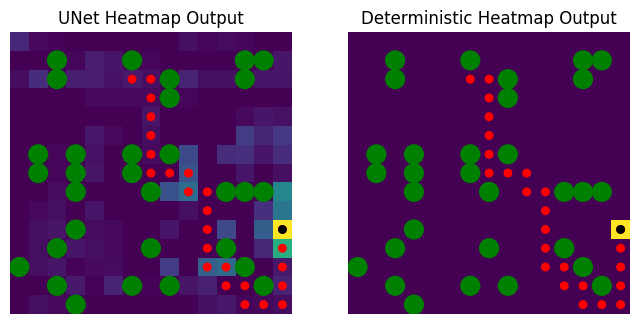

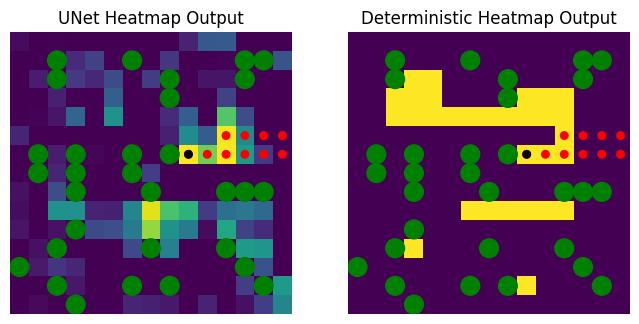

8        1.966114e-01   2.445677e-01


100%|██████████| 6148/6148 [07:11<00:00, 14.24it/s]


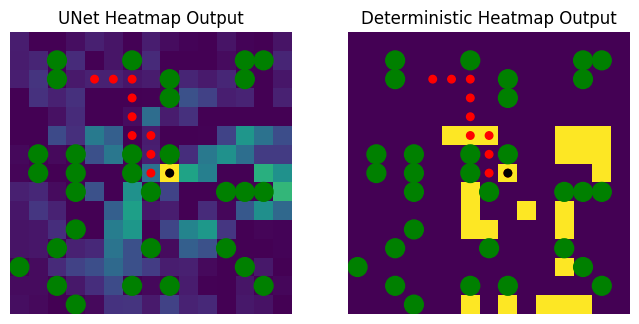

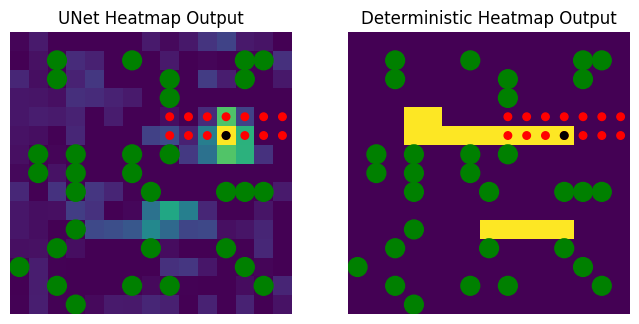

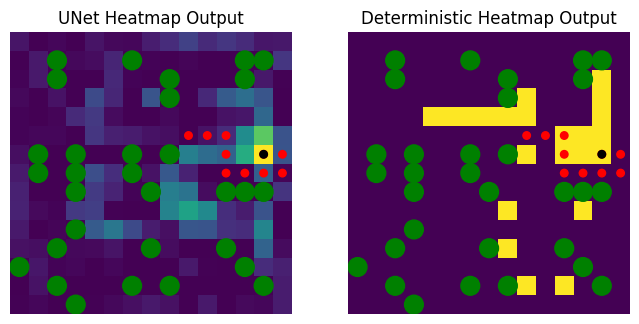

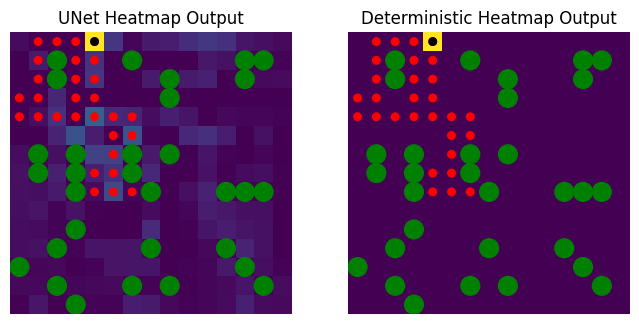

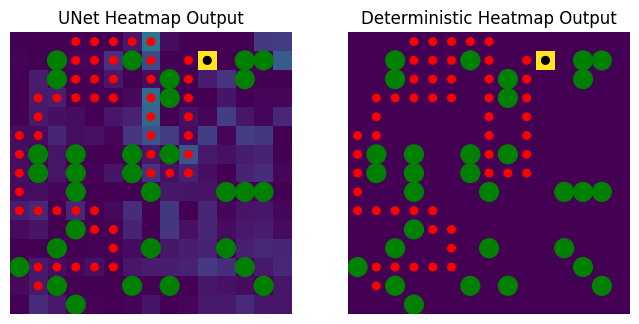

9        1.884944e-01   2.142287e-01


100%|██████████| 6148/6148 [07:12<00:00, 14.22it/s]


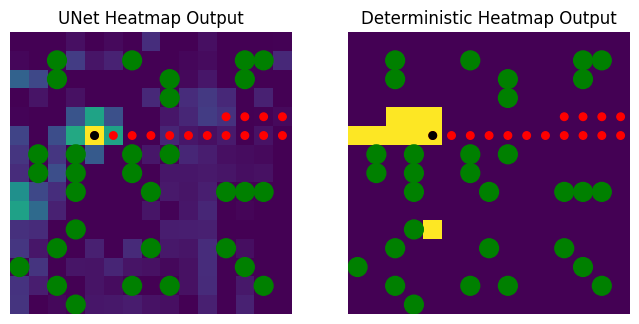

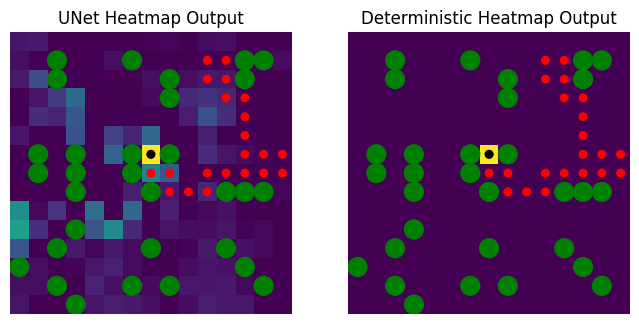

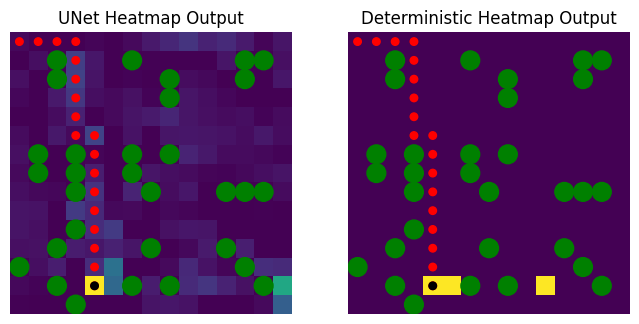

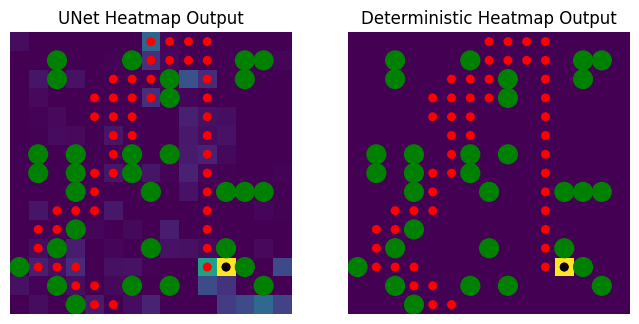

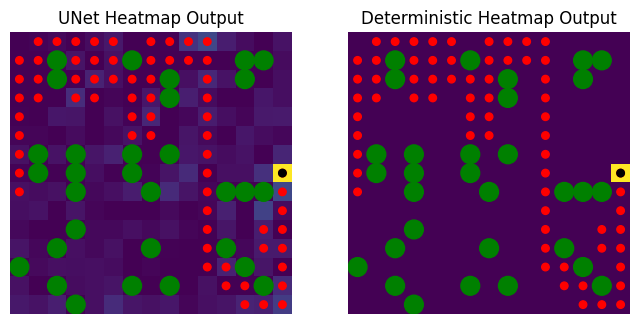

10       1.836616e-01   2.014659e-01


In [ ]:
model_2_4_current, loss_dict = train_model(
    train_data = train_data_current_2_4,
    test_data = test_data_current_2_4,
    visualize_data = visualize_data_current_2_4,
    model = UNet(32, bias=True),
    loss_fn = nn.CrossEntropyLoss(),
    epochs=10,
    lr=1e-4,
    print_every=1,
    visualize_images=5,
    batch_size=256
)

# Save UNet model
# torch.save(model_2_4_current.state_dict(), 'model_2_4_current_weights.pth')

## Evaluating

  0%|          | 0/10000 [00:00<?, ?it/s]c:\Users\20213032\OneDrive - TU Eindhoven\Documents\TUe\Y5\Q3\BEP\.venv\Lib\site-packages\torch\utils\_device.py:104: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
100%|██████████| 10000/10000 [02:29<00:00, 66.78it/s]


Method Deterministic has mean + std < 1 at path length 30 with value=np.float64(0.8899999999999999)
Method Deterministic has mean + std < 1 at path length 31 with value=np.float64(0.65)
Method Deterministic has mean + std < 1 at path length 32 with value=np.float64(0.45)
Method Deterministic has mean + std < 1 at path length 33 with value=np.float64(0.31999999999999995)
Method Deterministic has mean + std < 1 at path length 34 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 35 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 36 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 37 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 38 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 39 with value=np.float64(0.0)
Method Deterministic has mean + std < 1 at path length 40 with value=np.float64(0.0)
Method Deterministic has mean + 

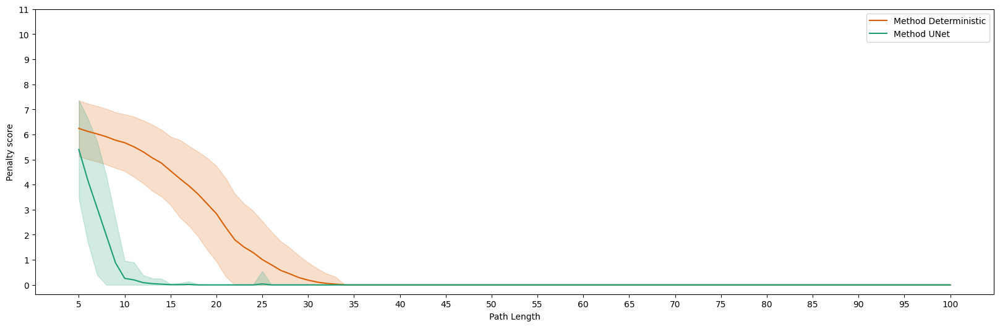

In [27]:
# UNet trained on Agent 2 and 4 tested on Agent 2
test_data_loader = DataLoader(visualize_data_current_2, batch_size=1, shuffle=True, generator=torch.Generator(device=device))
compare_UNet_to_Deterministic(test_data_loader, model_2_4_current)

  0%|          | 0/10000 [00:00<?, ?it/s]c:\Users\20213032\OneDrive - TU Eindhoven\Documents\TUe\Y5\Q3\BEP\.venv\Lib\site-packages\torch\utils\_device.py:104: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
100%|██████████| 10000/10000 [02:28<00:00, 67.34it/s]


Method Deterministic has mean + std < 1 at path length 30 with value=np.float64(0.89)
Method Deterministic has mean + std < 1 at path length 31 with value=np.float64(0.7200000000000001)
Method Deterministic has mean + std < 1 at path length 32 with value=np.float64(0.66)
Method Deterministic has mean + std < 1 at path length 33 with value=np.float64(0.63)
Method Deterministic has mean + std < 1 at path length 34 with value=np.float64(0.5)
Method Deterministic has mean + std < 1 at path length 35 with value=np.float64(0.52)
Method Deterministic has mean + std < 1 at path length 36 with value=np.float64(0.51)
Method Deterministic has mean + std < 1 at path length 37 with value=np.float64(0.5)
Method Deterministic has mean + std < 1 at path length 38 with value=np.float64(0.4)
Method Deterministic has mean + std < 1 at path length 39 with value=np.float64(0.41000000000000003)
Method Deterministic has mean + std < 1 at path length 40 with value=np.float64(0.44)
Method Deterministic has mea

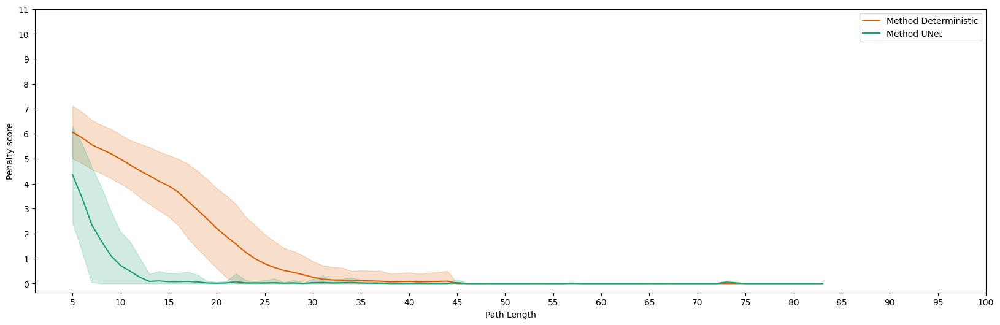

In [28]:
# UNet trained on Agent 2 and 4 tested on Agent 4
test_data_loader = DataLoader(visualize_data_current_4, batch_size=1, shuffle=True, generator=torch.Generator(device=device))
compare_UNet_to_Deterministic(test_data_loader, model_2_4_current)

# Predicting N times in the future

In [ ]:
def predict_next_N(model_next, path, board, N=5):
    path_truncated = path[:-N]
    path_next = path[-N:]

    masked_path = path_to_mask([path_truncated])
    masked_path = masked_path.reshape(15, 15)
    for i in range(N):
        output = model_next(torch.tensor(masked_path).unsqueeze(0).unsqueeze(0), torch.tensor(board).unsqueeze(0).unsqueeze(0).float())
    
        index = np.argmax(output.cpu().detach().numpy().squeeze().reshape(15, 15))
        x = index % 15
        y = index // 15
        masked_path = np.where(masked_path == 2, 1, masked_path)
        masked_path[y, x] = 2


        fig, ax = plt.subplots(1, 3, figsize = (8, 8))
        ax[0].imshow(output.cpu().detach().numpy().squeeze().reshape(15, 15))
        masked_path_standardized = standardize_masks(np.array([masked_path]))
        deterministic_output = determenistic_sub_finding(torch.tensor(masked_path_standardized).squeeze())
        ax[1].imshow(deterministic_output.cpu().squeeze())
        ax[2].imshow(masked_path)

        add_islands(ax[0])
        add_islands(ax[1])
        add_islands(ax[2])

        length_path = len(path)
        for index, pos in enumerate(path[: -(N - i)]):
            pos = pos
            y, x = pos[0], pos[1]
            alpha = ((index+1) / length_path) ** 2
            alpha = 1
            circle = Circle((x, y), 0.2, fill=True, color="red", alpha=alpha)
            ax[0].add_patch(circle)
            circle = Circle((x, y), 0.2, fill=True, color="red", alpha=alpha)
            ax[1].add_patch(circle)
            circle = Circle((x, y), 0.2, fill=True, color="red", alpha=alpha)
            ax[2].add_patch(circle)

        index = np.argmax(output.cpu().detach().numpy().squeeze().reshape(15, 15))
        x = index % 15
        y = index // 15
        circle = Circle((x, y), 0.2, fill=True, color="black", alpha=1)
        ax[0].add_patch(circle)
        circle = Circle((x, y), 0.2, fill=True, color="black", alpha=1)
        ax[1].add_patch(circle)
        circle = Circle((x, y), 0.2, fill=True, color="black", alpha=1)
        ax[2].add_patch(circle)

        for a in ax.flat:
            a.axis('off')

        ax[0].set_title("UNet")
        ax[1].set_title("Deterministic")

        plt.show()

In [14]:
predict_next_N(model_next, intermediate_paths[1444], board, N=50)

NameError: name 'predict_next_N' is not defined

# Visualizations for BEP report

In [19]:
combined_paths = intermediate_paths + hybrid_paths
standardized_sequences = intermediate_sequences_standardized + hybrid_sequences_standardized
combined_paths_subdivided_10_13 = [] 
combined_sequences_10_13 = []

for path, sequence in zip(combined_paths, standardized_sequences):
    for i in range(10, 13 + 1):
        combined_sequences_10_13.append(sequence[:i])
        combined_paths_subdivided_10_13.append(path[:i])
print(f"{len(combined_sequences_10_13)=}, {len(combined_paths_subdivided_10_13)=}")

masks_current = path_to_mask(combined_sequences_10_13)
print("Masks created")
paths_mapped_standardized = standardize_masks(masks_current)
print("Masks standardized")
final_positions = [path[-1][0] * 15 + path[-1][1] for path in combined_paths_subdivided_10_13]
print("Final positions calculated")

visualize_data_current_10_13 = SequenceMappedTest(paths_mapped_standardized, final_positions, board, combined_paths_subdivided_10_13, device)
data_loader_10_13 = DataLoader(visualize_data_current_10_13, batch_size=1, shuffle=False, generator=torch.Generator(device=device))

len(combined_sequences_10_13)=154088, len(combined_paths_subdivided_10_13)=154088
Masks created
Masks standardized
Final positions calculated


In [ ]:
# Which starting position have the highest penalty score?


scores_UNet = np.zeros((15, 15))
scores_Deterministic = np.zeros((15, 15))
scores_UNet_listed = [0] * len(combined_paths_subdivided_10_13)
scores_Deterministic_listed = [0] * len(combined_paths_subdivided_10_13)
for masked_path, final_position, board, path, index in tqdm(data_loader_10_13):
    # Whole board has sum probability of 1
    deterministic_output = determenistic_sub_finding(masked_path.squeeze(), board.squeeze())
    # Each tile on this board can have probability of [0, 1]. The sum of board would be higher than 1
    UNet_output = model_2_4_current(masked_path, board)
    # Normalize whole UNet output to sum to 1
    UNet_output = torch.softmax(UNet_output, dim=1)

    # Detach from cuda
    deterministic_output = deterministic_output.cpu().detach().numpy()
    UNet_output = UNet_output.cpu().detach().numpy().squeeze().reshape(15, 15)
    final_position = final_position.cpu().detach().numpy().squeeze()

    # Transform final position to x and y
    x_final = final_position % 15
    y_final = final_position // 15

    # Calculate the distance from final_position * probability for each tile and sum it up
    distance_matrix_x = np.array(list(range(15)) * 15).reshape(15, 15)
    distance_matrix_y = distance_matrix_x.T

    # Calculate the distance from final_position for each tile
    # distance_from_final = np.abs(distance_matrix_x - x_final) + np.abs(distance_matrix_y - y_final)
    distance_from_final = np.maximum(np.abs(distance_matrix_x - x_final), np.abs(distance_matrix_y - y_final))
    
    # Calculate the expected probability
    UNet_estimation = (distance_from_final * UNet_output).sum()
    Deterministic_estimation = (distance_from_final * deterministic_output).sum()

    begin_x, begin_y = path[0][0][0].item(), path[0][0][1].item()
    scores_UNet[begin_x, begin_y] += UNet_estimation
    scores_Deterministic[begin_x, begin_y] += Deterministic_estimation
    scores_UNet_listed[index] = UNet_estimation
    scores_Deterministic_listed[index] = Deterministic_estimation

100%|██████████| 154088/154088 [44:26<00:00, 57.78it/s]  


In [49]:
starting_positions = [path[0][0] * 15 + path[0][1] for path in combined_paths_subdivided_10_13]
starting_positions = np.array(starting_positions)
index, counts = np.unique(starting_positions, return_counts=True)

def normalize_scores(scores):
    for pos_index, count in zip(index, counts):
        x = pos_index % 15
        y = pos_index // 15
        scores[x, y] = scores[x, y] / count    

    return scores

In [ ]:
# Store the scores
# Store the scores in list
# np.save("scores_UNet.npy", scores_UNet)
# np.save("scores_Deterministic.npy", scores_Deterministic)
# with open("scores_UNet_listed.pkl", 'wb') as file:
#     pickle.dump(scores_UNet_listed, file)  
# with open("scores_Deterministic_listed.pkl", 'wb') as file:
#     pickle.dump(scores_Deterministic_listed, file)

Text(0.5, 1.0, 'Deterministic')

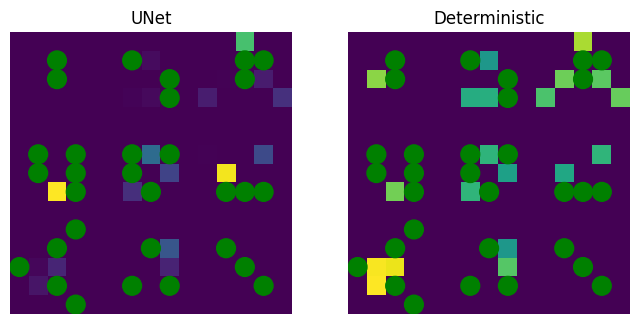

In [48]:
scores_UNet = np.load("scores_UNet.npy")
# scores_UNet_transformed = np.where(scores_UNet == 0, 0.0001, scores_UNet)
scores_UNet_transformed = normalize_scores(scores_UNet)

fig, ax = plt.subplots(1, 2, figsize = (8, 8))

ax[0].imshow(scores_UNet_transformed)
ax[0].axis('off')

add_islands(ax[0])
add_islands(ax[1])
ax[0].set_title("UNet")

scores_Deterministic = np.load("scores_Deterministic.npy")
# scores_Deterministic_transformed = np.where(scores_Deterministic == 0, 0.0001, scores_Deterministic)
scores_Deterministic_transformed = normalize_scores(scores_Deterministic)

ax[1].imshow(scores_Deterministic_transformed)
ax[1].axis('off')
ax[1].set_title("Deterministic")


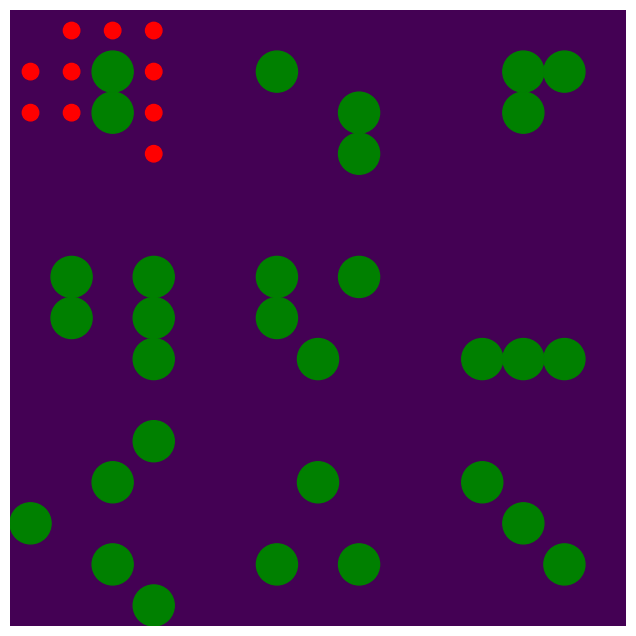

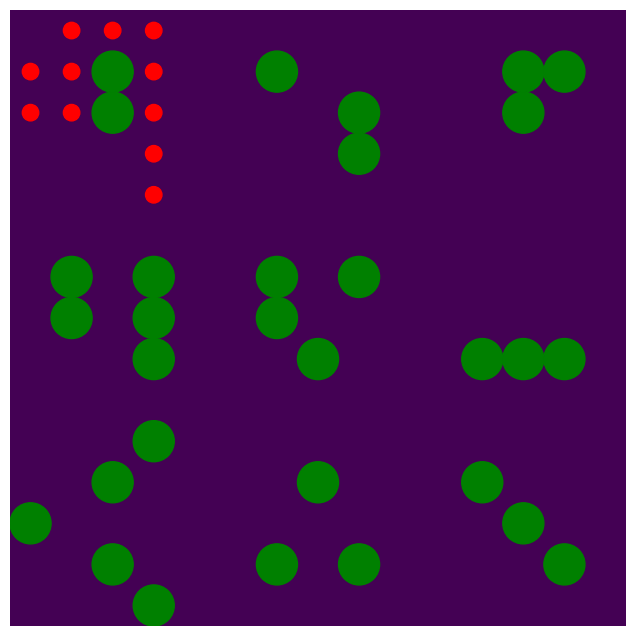

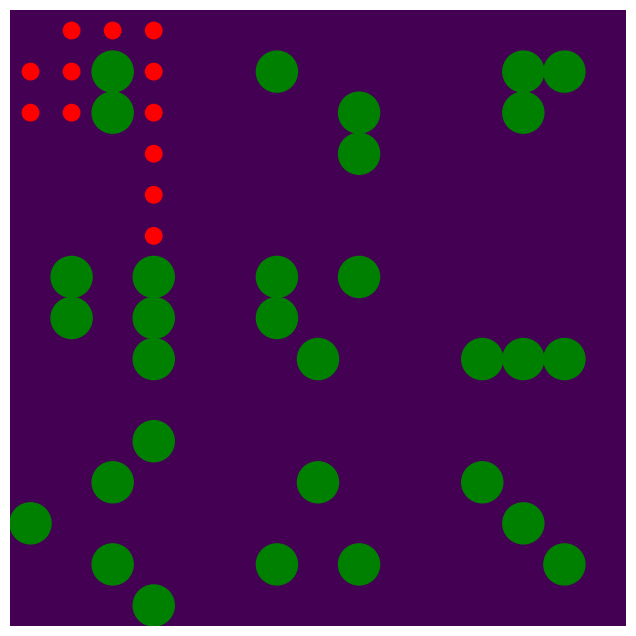

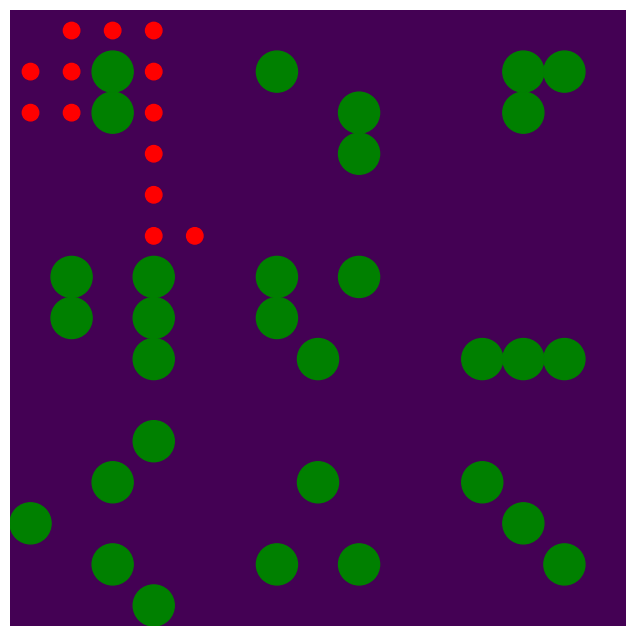

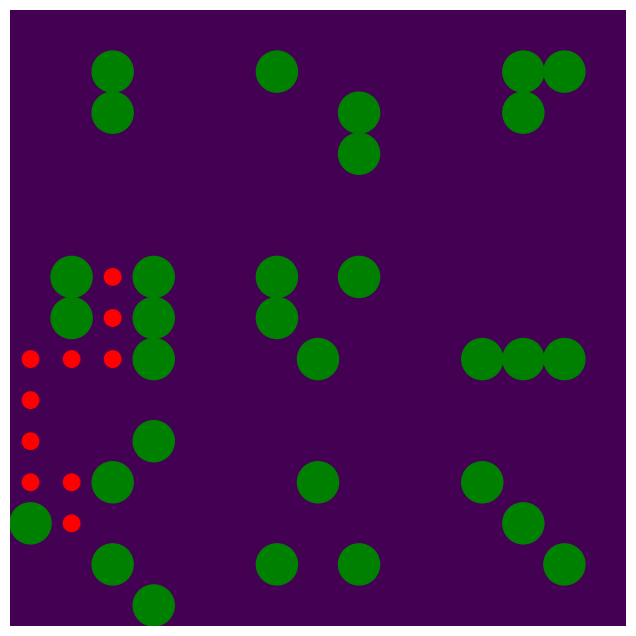

...

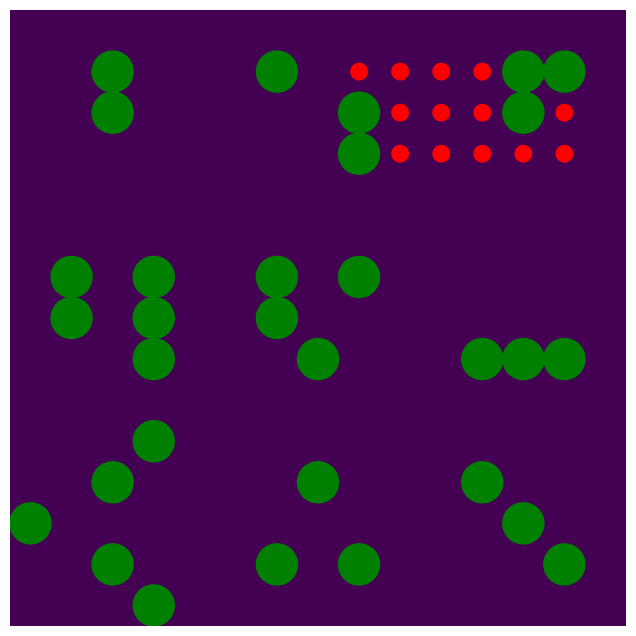

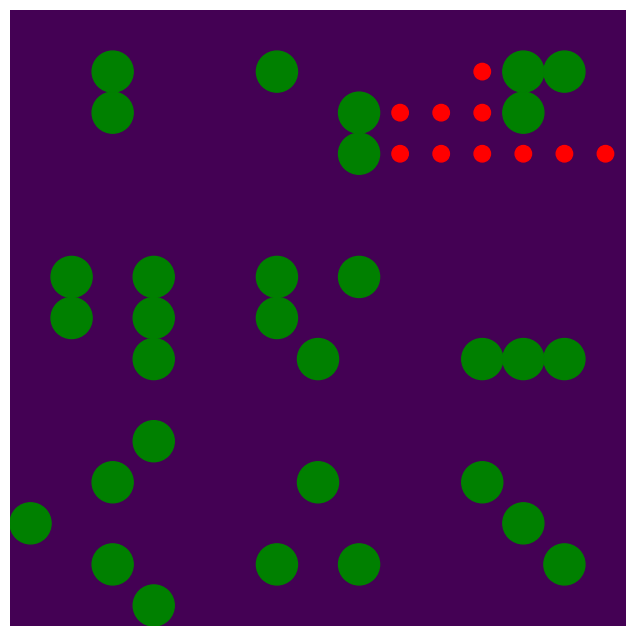

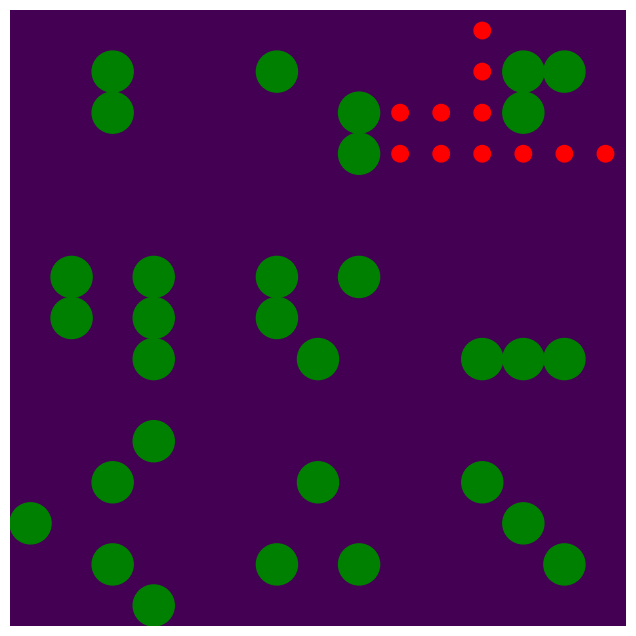

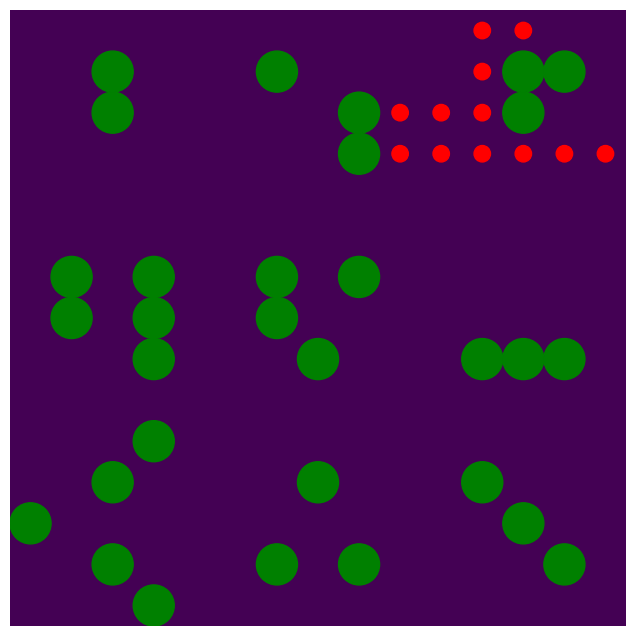

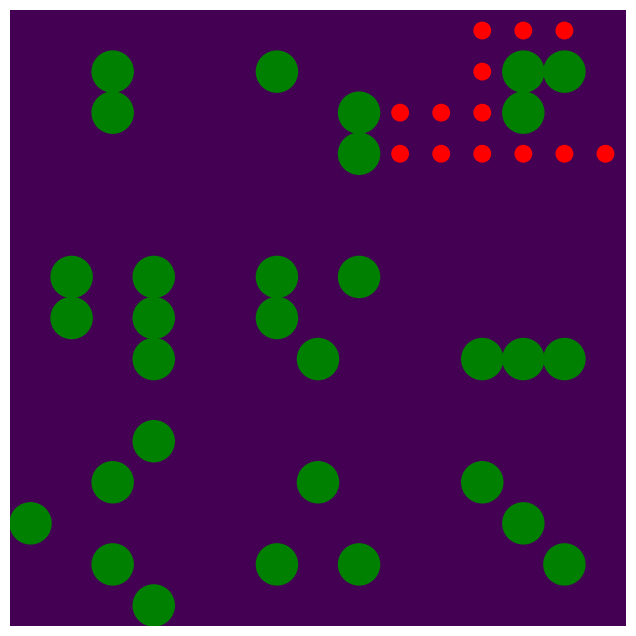

KeyboardInterrupt: 

In [71]:
flattened = scores_Deterministic_transformed.flatten()
score_df = pd.DataFrame({"UNet": flattened})
index_10 = score_df.sort_values(by="UNet", ascending=False).head(10).index
position_10 = [(index % 15, index // 15) for index in index_10]

for index, starting_position in enumerate(starting_positions):
    if starting_position in index_10:
        path = combined_paths_subdivided_10_13[index]
        fig, ax = plt.subplots(1, 1, figsize = (8, 8))
        ax.imshow(np.zeros((15, 15)))

        ax.axis('off')

        add_islands(ax)

        length_path = len(path)
        for index, pos in enumerate(path):
            pos = pos
            y, x = pos[0], pos[1]
            alpha = ((index+1) / length_path) ** 2
            alpha = 1
            circle = Circle((x, y), 0.2, fill=True, color="red", alpha=alpha)
            ax.add_patch(circle)
        plt.show()

Index([109721, 136593, 100489, 151937, 148109, 115085, 137365, 82825, 80521,
       96665],
      dtype='int64')


 52%|█████▏    | 80480/154088 [02:19<01:54, 641.84it/s]

[tensor([[3, 3]], device='cuda:0'), tensor([[3, 4]], device='cuda:0'), tensor([[3, 5]], device='cuda:0'), tensor([[4, 5]], device='cuda:0'), tensor([[5, 5]], device='cuda:0'), tensor([[6, 5]], device='cuda:0'), tensor([[7, 5]], device='cuda:0'), tensor([[8, 5]], device='cuda:0'), tensor([[9, 5]], device='cuda:0'), tensor([[10,  5]], device='cuda:0'), tensor([[11,  5]], device='cuda:0')]


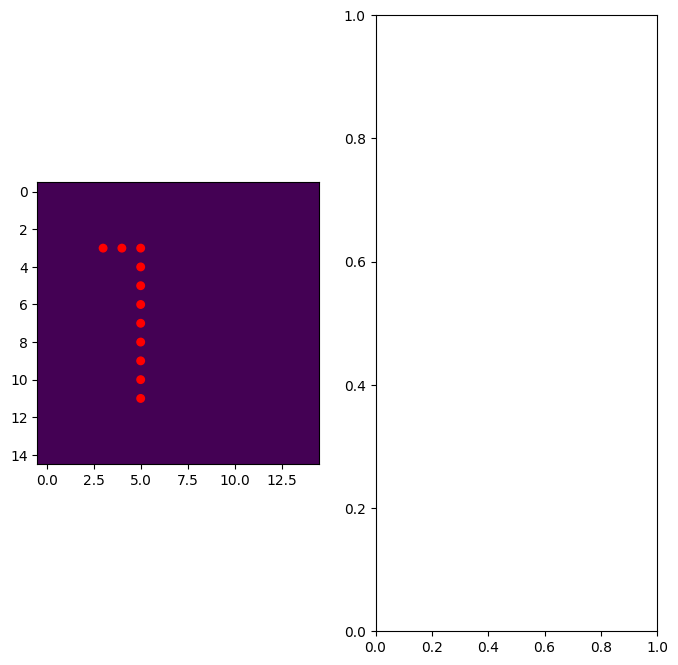

 54%|█████▎    | 82813/154088 [02:23<01:56, 609.67it/s]

[tensor([[3, 3]], device='cuda:0'), tensor([[3, 4]], device='cuda:0'), tensor([[3, 5]], device='cuda:0'), tensor([[4, 5]], device='cuda:0'), tensor([[5, 5]], device='cuda:0'), tensor([[6, 5]], device='cuda:0'), tensor([[7, 5]], device='cuda:0'), tensor([[8, 5]], device='cuda:0'), tensor([[9, 5]], device='cuda:0'), tensor([[10,  5]], device='cuda:0'), tensor([[11,  5]], device='cuda:0')]


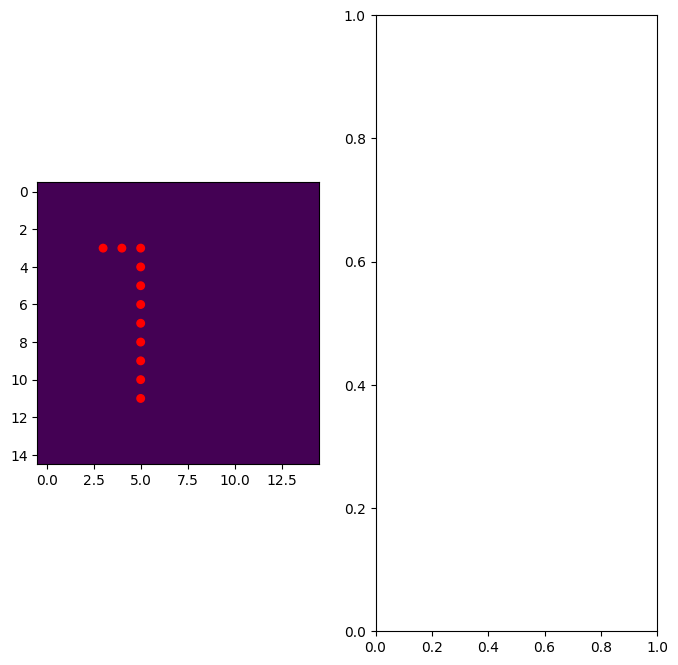

 63%|██████▎   | 96653/154088 [02:46<01:37, 587.12it/s]

[tensor([[3, 3]], device='cuda:0'), tensor([[3, 4]], device='cuda:0'), tensor([[3, 5]], device='cuda:0'), tensor([[4, 5]], device='cuda:0'), tensor([[5, 5]], device='cuda:0'), tensor([[6, 5]], device='cuda:0'), tensor([[7, 5]], device='cuda:0'), tensor([[8, 5]], device='cuda:0'), tensor([[9, 5]], device='cuda:0'), tensor([[10,  5]], device='cuda:0'), tensor([[11,  5]], device='cuda:0')]


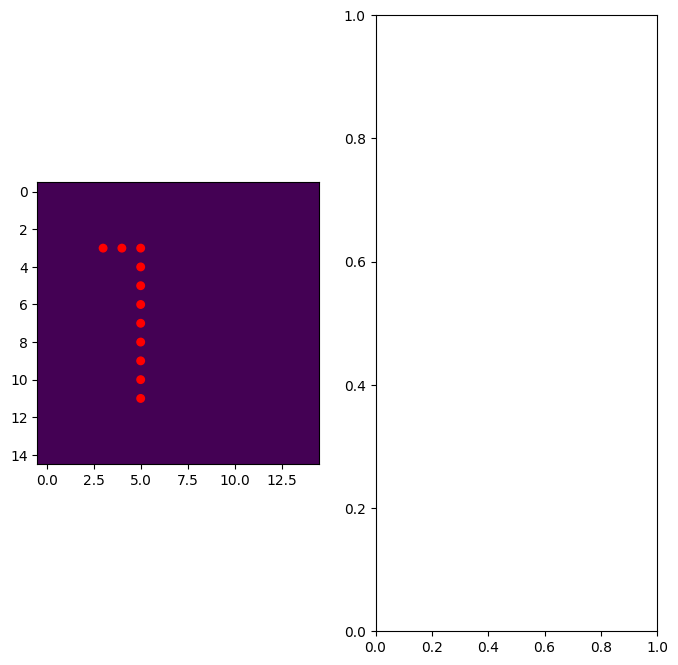

 65%|██████▌   | 100451/154088 [02:52<01:23, 644.99it/s]

[tensor([[3, 3]], device='cuda:0'), tensor([[3, 4]], device='cuda:0'), tensor([[3, 5]], device='cuda:0'), tensor([[4, 5]], device='cuda:0'), tensor([[5, 5]], device='cuda:0'), tensor([[6, 5]], device='cuda:0'), tensor([[7, 5]], device='cuda:0'), tensor([[8, 5]], device='cuda:0'), tensor([[9, 5]], device='cuda:0'), tensor([[10,  5]], device='cuda:0'), tensor([[11,  5]], device='cuda:0')]


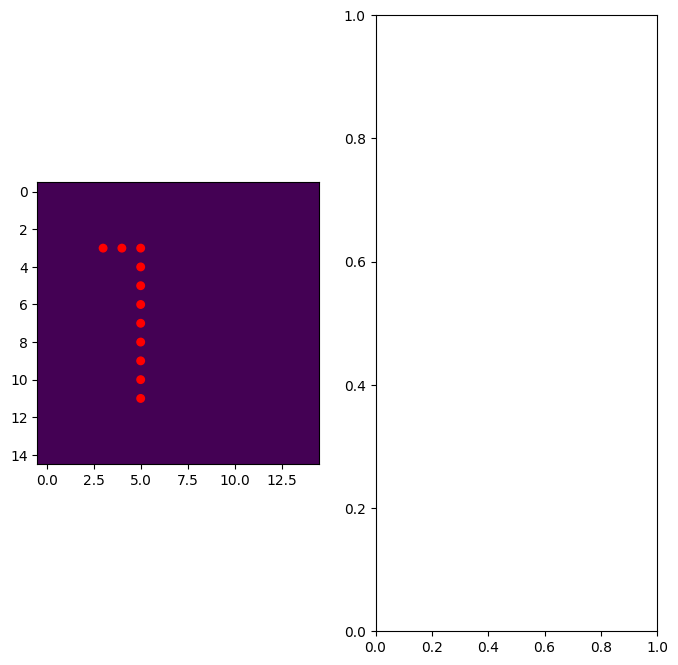

 71%|███████   | 109719/154088 [03:08<01:10, 633.82it/s]

[tensor([[3, 3]], device='cuda:0'), tensor([[3, 4]], device='cuda:0'), tensor([[3, 5]], device='cuda:0'), tensor([[4, 5]], device='cuda:0'), tensor([[5, 5]], device='cuda:0'), tensor([[6, 5]], device='cuda:0'), tensor([[7, 5]], device='cuda:0'), tensor([[8, 5]], device='cuda:0'), tensor([[9, 5]], device='cuda:0'), tensor([[10,  5]], device='cuda:0'), tensor([[11,  5]], device='cuda:0')]


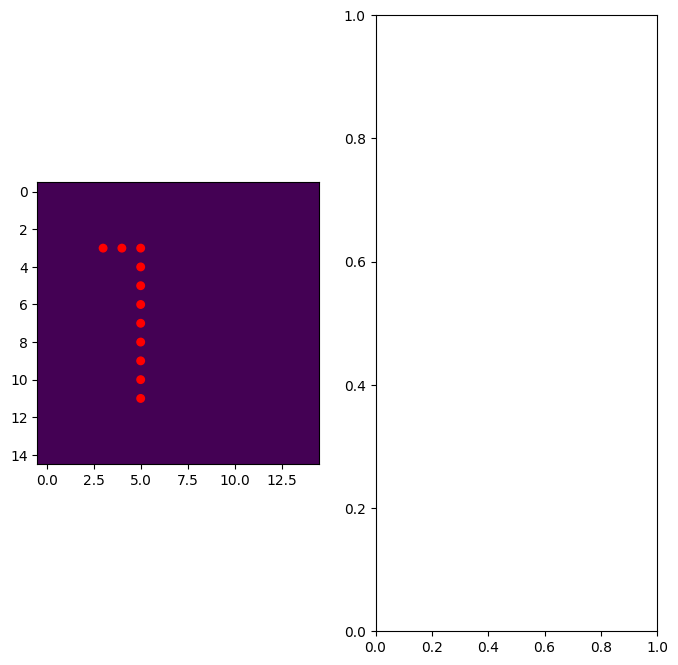

 75%|███████▍  | 115030/154088 [03:16<01:02, 624.84it/s]

[tensor([[3, 3]], device='cuda:0'), tensor([[3, 4]], device='cuda:0'), tensor([[3, 5]], device='cuda:0'), tensor([[4, 5]], device='cuda:0'), tensor([[5, 5]], device='cuda:0'), tensor([[6, 5]], device='cuda:0'), tensor([[7, 5]], device='cuda:0'), tensor([[8, 5]], device='cuda:0'), tensor([[9, 5]], device='cuda:0'), tensor([[10,  5]], device='cuda:0'), tensor([[11,  5]], device='cuda:0')]


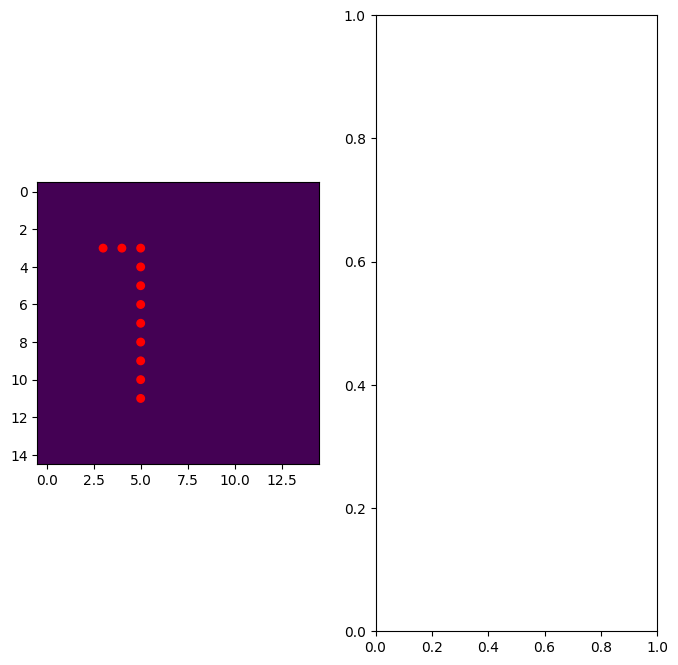

 89%|████████▊ | 136545/154088 [03:51<00:27, 634.71it/s]

[tensor([[3, 3]], device='cuda:0'), tensor([[3, 4]], device='cuda:0'), tensor([[3, 5]], device='cuda:0'), tensor([[4, 5]], device='cuda:0'), tensor([[5, 5]], device='cuda:0'), tensor([[6, 5]], device='cuda:0'), tensor([[7, 5]], device='cuda:0'), tensor([[8, 5]], device='cuda:0'), tensor([[9, 5]], device='cuda:0'), tensor([[10,  5]], device='cuda:0'), tensor([[11,  5]], device='cuda:0')]


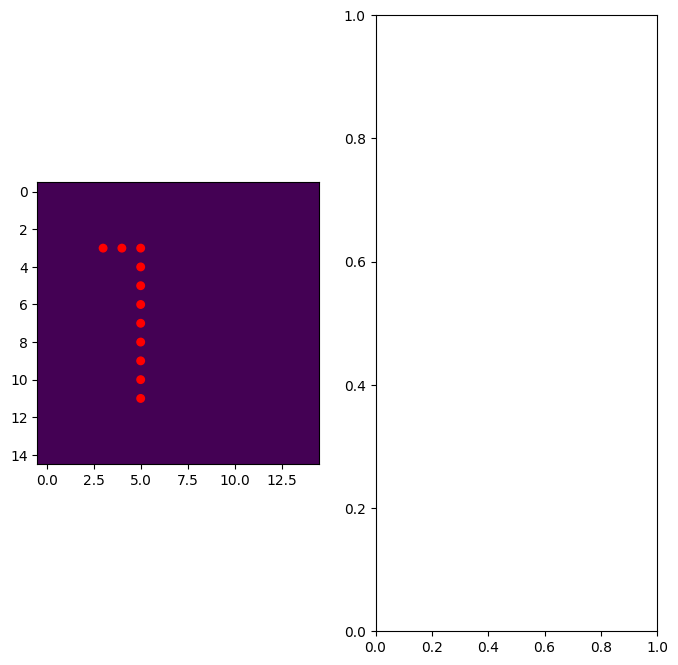

 89%|████████▉ | 137307/154088 [03:53<00:27, 613.20it/s]

[tensor([[3, 3]], device='cuda:0'), tensor([[3, 4]], device='cuda:0'), tensor([[3, 5]], device='cuda:0'), tensor([[4, 5]], device='cuda:0'), tensor([[5, 5]], device='cuda:0'), tensor([[6, 5]], device='cuda:0'), tensor([[7, 5]], device='cuda:0'), tensor([[8, 5]], device='cuda:0'), tensor([[9, 5]], device='cuda:0'), tensor([[10,  5]], device='cuda:0'), tensor([[11,  5]], device='cuda:0')]


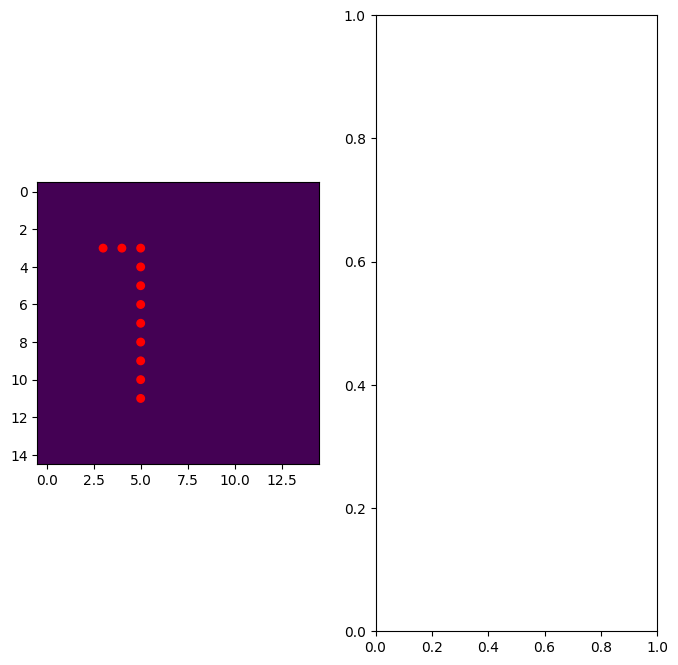

 96%|█████████▌| 148055/154088 [04:10<00:09, 615.11it/s]

[tensor([[3, 3]], device='cuda:0'), tensor([[3, 4]], device='cuda:0'), tensor([[3, 5]], device='cuda:0'), tensor([[4, 5]], device='cuda:0'), tensor([[5, 5]], device='cuda:0'), tensor([[6, 5]], device='cuda:0'), tensor([[7, 5]], device='cuda:0'), tensor([[8, 5]], device='cuda:0'), tensor([[9, 5]], device='cuda:0'), tensor([[10,  5]], device='cuda:0'), tensor([[11,  5]], device='cuda:0')]


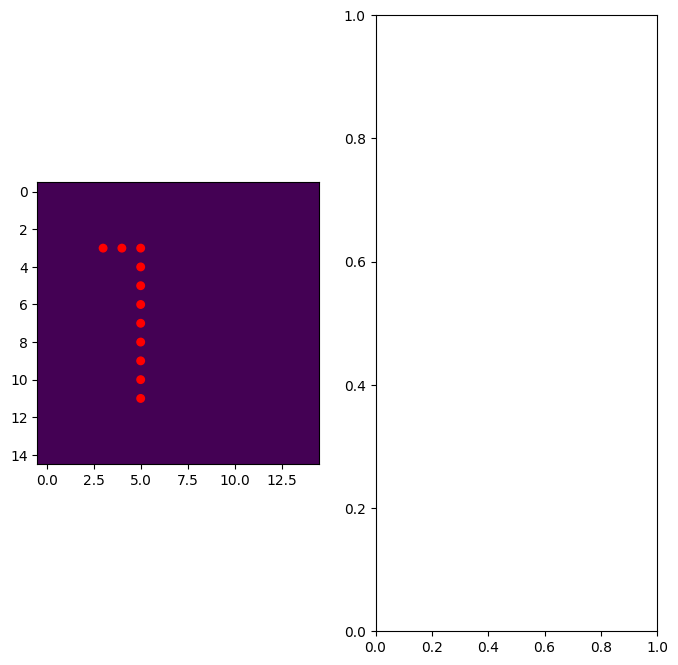

 99%|█████████▊| 151932/154088 [04:17<00:03, 632.58it/s]

[tensor([[3, 3]], device='cuda:0'), tensor([[3, 4]], device='cuda:0'), tensor([[3, 5]], device='cuda:0'), tensor([[4, 5]], device='cuda:0'), tensor([[5, 5]], device='cuda:0'), tensor([[6, 5]], device='cuda:0'), tensor([[7, 5]], device='cuda:0'), tensor([[8, 5]], device='cuda:0'), tensor([[9, 5]], device='cuda:0'), tensor([[10,  5]], device='cuda:0'), tensor([[11,  5]], device='cuda:0')]


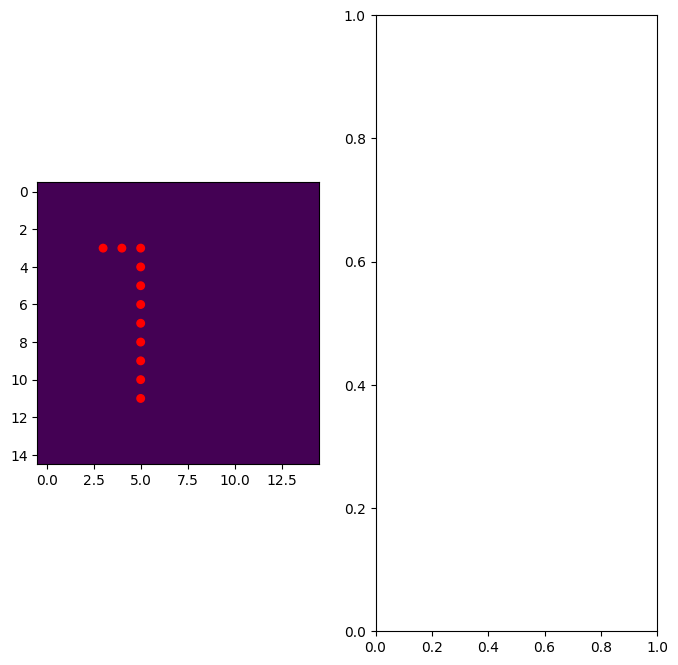

100%|██████████| 154088/154088 [04:21<00:00, 589.96it/s]


In [24]:
# See which movement has highest score for UNet and Deterministic
# Load in deterministic scores
scores_UNet_listed = pickle.load(open("scores_UNet_listed.pkl", 'rb'))
scores_UNet_df = pd.DataFrame(scores_UNet_listed, columns=["score"])
index_10 = scores_UNet_df.sort_values(by="score", ascending=False).head(10).index
print(index_10)

count = 0
for masked_path, final_position, board, path, index in tqdm(data_loader_10_13):
    if count in index_10:
        fig, ax = plt.subplots(1, 2, figsize = (8, 8))
        ax[0].imshow(np.zeros((15, 15)))

        print(path)

        length_path = len(path)
        for index, pos in enumerate(path):
            pos = pos.cpu().detach().flatten()
            y, x = pos[0], pos[1]
            alpha = ((index+1) / length_path) ** 2
            alpha = 1
            circle = Circle((x, y), 0.2, fill=True, color="red", alpha=alpha)
            ax[0].add_patch(circle)
        plt.show()
    count += 1

In [10]:
# def compare_methods(masks, final_positions):

test_data_loader = DataLoader(test_data_current, batch_size=1, shuffle=True, generator=torch.Generator(device=device))

scores = np.zeros((len(test_data_loader), 3))
for masked_path, final_position, board, path, index in tqdm(test_data_loader):
    # Whole board has sum probability of 1
    deterministic_output = determenistic_sub_finding(masked_path.squeeze(), board.squeeze())
    # Each tile on this board can have probability of [0, 1]. The sum of board would be higher than 1
    UNet_output = model_current(masked_path, board)
    # Normalize whole UNet output to sum to 1
    UNet_output = torch.softmax(UNet_output, dim=1)

    # Detach from cuda
    deterministic_output = deterministic_output.cpu().detach().numpy()
    UNet_output = UNet_output.cpu().detach().numpy().squeeze().reshape(15, 15)
    final_position = final_position.cpu().detach().numpy().squeeze()

    # Transform final position to x and y
    x_final = final_position % 15
    y_final = final_position // 15

    # Calculate the distance from final_position * probability for each tile and sum it up
    distance_matrix_x = np.array(list(range(15)) * 15).reshape(15, 15)
    distance_matrix_y = distance_matrix_x.T

    # Calculate the distance from final_position for each tile
    # distance_from_final = np.abs(distance_matrix_x - x_final) + np.abs(distance_matrix_y - y_final)
    distance_from_final = np.maximum(np.abs(distance_matrix_x - x_final), np.abs(distance_matrix_y - y_final))
    
    # Calculate the expected probability
    UNet_estimation = (distance_from_final * UNet_output).sum()
    Deterministic_estimation = (distance_from_final * deterministic_output).sum()

    scores[index, 0] = UNet_estimation
    scores[index, 1] = Deterministic_estimation
    scores[index, 2] = len(path)

  0%|          | 0/10000 [00:00<?, ?it/s]c:\Users\20213032\OneDrive - TU Eindhoven\Documents\TUe\Y5\Q3\BEP\.venv\Lib\site-packages\torch\utils\_device.py:104: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
100%|██████████| 10000/10000 [02:55<00:00, 57.10it/s]


In [21]:
x_final = 7
y_final = 8

# Calculate the Chebyshov distance
distance_matrix_x = np.array(list(range(15)) * 15).reshape(15, 15)
distance_matrix_y = distance_matrix_x.T
chebyshov_distance = np.maximum(np.abs(distance_matrix_x - x_final), np.abs(distance_matrix_y - y_final))

# Calculate Manhattan distance
manhattan_distance = np.abs(distance_matrix_x - x_final) + np.abs(distance_matrix_y - y_final)

# Calcuate Euclidean distance
euclidean_distance = np.sqrt((distance_matrix_x - x_final) ** 2 + (distance_matrix_y - y_final) ** 2)

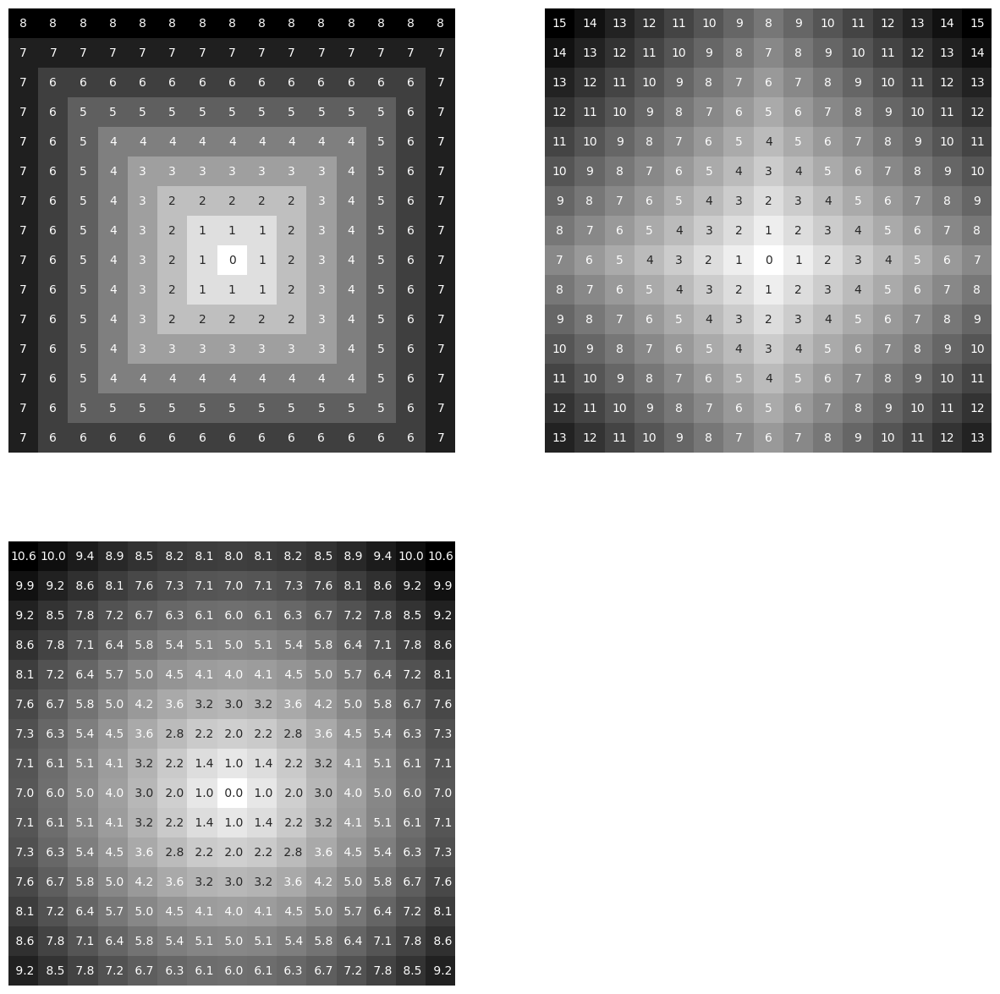

In [50]:
fig, ax = plt.subplots(2, 2, figsize = (15, 15))

sns.heatmap(chebyshov_distance, annot=True, fmt="d", cmap="gray_r", cbar=False, ax=ax[0, 0])
sns.heatmap(manhattan_distance, annot=True, fmt="d", cmap="gray_r", cbar=False, ax=ax[0, 1])
sns.heatmap(euclidean_distance, annot=True, fmt="4.1f", cmap="gray_r", cbar=False, ax=ax[1, 0])

ax[0, 0].axis('off')
ax[0, 1].axis('off')
ax[1, 0].axis('off')
ax[1, 1].axis('off')

plt.show()

<BarContainer object of 96 artists>

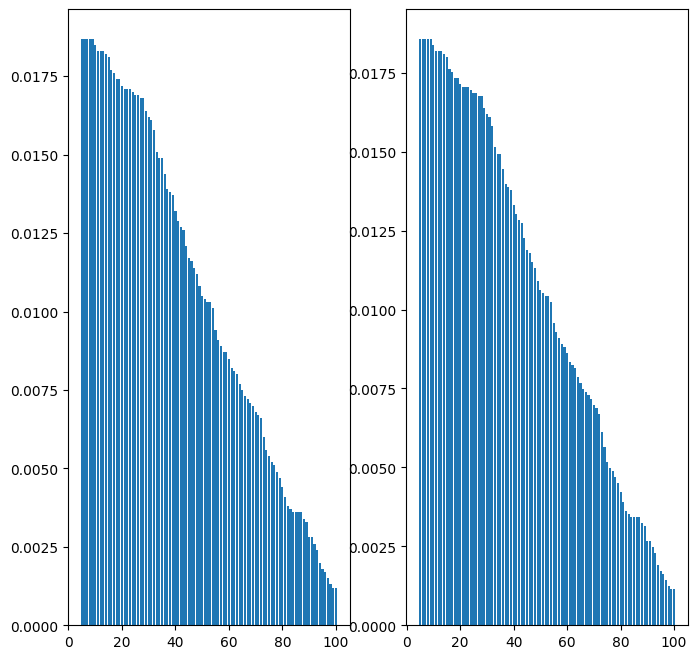

In [15]:
fig, ax = plt.subplots(1, 2, figsize=(8, 8))

train_lengths = [len(path) for path in train_paths]
train_lengths = np.unique(np.array(train_lengths), return_counts=True)
test_lengths = [len(path) for path in test_paths]
test_lengths = np.unique(np.array(test_lengths), return_counts=True)

ax[0].bar(test_lengths[0], test_lengths[1] / sum(test_lengths[1]))
ax[1].bar(train_lengths[0], train_lengths[1] / sum(train_lengths[1]))




<Axes: xlabel='Length', ylabel='score'>

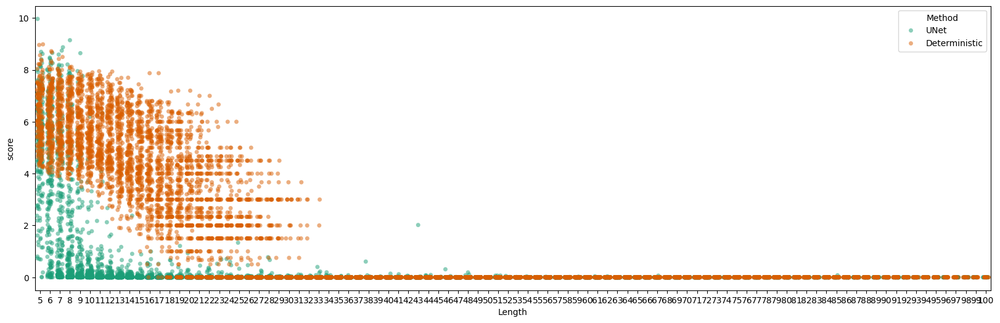

In [ ]:
scores_df_initial = pd.DataFrame(scores, columns=["UNet", "Deterministic", "Length"])
scores_df_initial["Length"] = scores_df_initial["Length"].astype(int)

scores_df_UNet = pd.DataFrame(scores_df_initial["UNet"], columns=["score"])
scores_df_UNet["score"] = scores_df_initial["UNet"]
scores_df_UNet["Length"] = scores_df_initial["Length"]
scores_df_UNet["Method"] = "UNet"
scores_df_Deterministic = pd.DataFrame(scores_df_initial["Deterministic"], columns=["score"])
scores_df_Deterministic["score"] = scores_df_initial["Deterministic"]
scores_df_Deterministic["Length"] = scores_df_initial["Length"]
scores_df_Deterministic["Method"] = "Deterministic"

scores_df = pd.concat([scores_df_UNet, scores_df_Deterministic], ignore_index=True).reset_index(drop=True)

plt.figure(figsize=(20, 6))
sns.stripplot(x="Length", y="score", hue="Method", palette=["#1b9e77", "#d95f02"], data=scores_df, jitter=0.3, alpha=0.5)

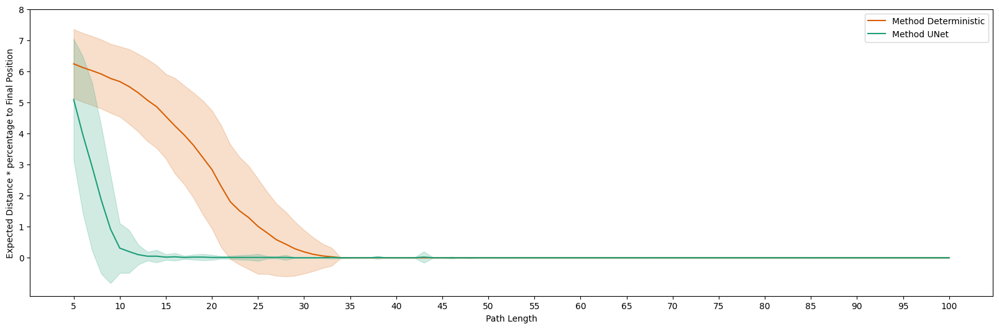

In [ ]:
std_df = pd.pivot_table(
    scores_df,
    values="score",
    index="Method",
    columns="Length",
    aggfunc=["mean", "std"]
).round(2)

fig, ax = plt.subplots(figsize=(20, 6))

for method, stats in std_df.iterrows():
    mean = stats[:len(stats)//2].values
    std = stats[len(stats)//2:].values
    
    ax.plot(range(5, 101), mean, label=f"Method {method}", color="#1b9e77" if method == "UNet" else "#d95f02")
    ax.fill_between(range(5, 101), mean - std, mean+std, alpha=0.2, color="#1b9e77" if method == "UNet" else "#d95f02")
ax.set_xticks(range(5, 101, 5))
ax.set_yticks(range(0, scores_df["score"].max().astype(int)))

ax.set_xlabel("Path Length")
ax.set_ylabel("Penalty score")
ax.legend()

Sequence of movement:  0 0 2 0 2 2 0 3 0 3 1 3 0 0 0 3 1 3 0 3
Current submarine position: [ 2 11]


(np.float64(-0.5), np.float64(14.5), np.float64(14.5), np.float64(-0.5))

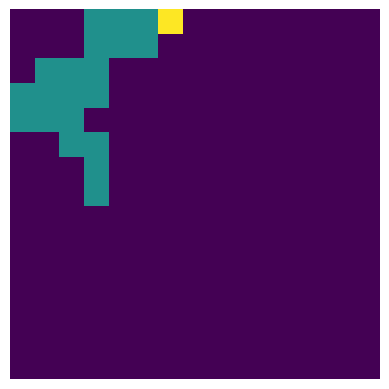

In [30]:
test = intermediate_sequences[1444][:40]
print("Sequence of movement:", test)
print("Current submarine position:", intermediate_paths[1444][-1])
path = actions_to_path([test])[0]
mask = path_to_mask([path])[0]
plt.imshow(mask)
plt.axis('off')

In [22]:
torch.tensor(board).unsqueeze(0).unsqueeze(0).float().shape

c:\Users\20213032\OneDrive - TU Eindhoven\Documents\TUe\Y5\Q3\BEP\.venv\Lib\site-packages\torch\utils\_device.py:104: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


torch.Size([1, 1, 1, 1, 15, 15])

c:\Users\20213032\OneDrive - TU Eindhoven\Documents\TUe\Y5\Q3\BEP\.venv\Lib\site-packages\torch\utils\_device.py:104: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


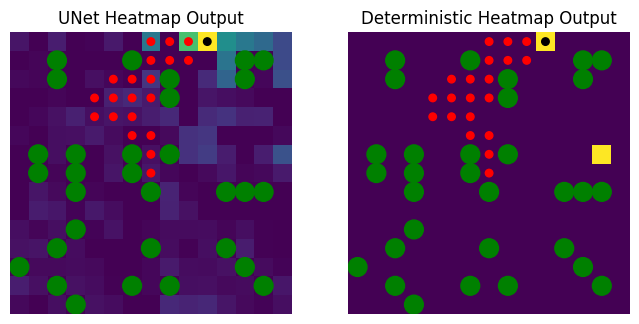

In [34]:
output = model_current(torch.tensor(mask).unsqueeze(0).unsqueeze(0), torch.tensor(board).float())
path = intermediate_paths[1444][:20]

fig, ax = plt.subplots(1, 2, figsize = (8, 8))
ax[0].imshow(output.cpu().detach().numpy().squeeze().reshape(15, 15))
deterministic_output = determenistic_sub_finding(torch.tensor(mask).squeeze(), board.squeeze())
ax[1].imshow(deterministic_output.cpu().squeeze())

add_islands(ax[0])
add_islands(ax[1])

length_path = len(path)
for index, pos in enumerate(path):
    pos = pos
    y, x = pos[0], pos[1]
    alpha = ((index+1) / length_path) ** 2
    alpha = 1
    circle = Circle((x, y), 0.2, fill=True, color="red", alpha=alpha)
    ax[0].add_patch(circle)
    circle = Circle((x, y), 0.2, fill=True, color="red", alpha=alpha)
    ax[1].add_patch(circle)

index = np.argmax(output.cpu().detach().numpy().squeeze().reshape(15, 15))
x = index % 15
y = index // 15
circle = Circle((x, y), 0.2, fill=True, color="black", alpha=1)
ax[0].add_patch(circle)
circle = Circle((x, y), 0.2, fill=True, color="black", alpha=1)
ax[1].add_patch(circle)

for a in ax.flat:
    a.axis('off')

ax[0].set_title("UNet Heatmap Output")
ax[1].set_title("Deterministic Heatmap Output")

plt.show()

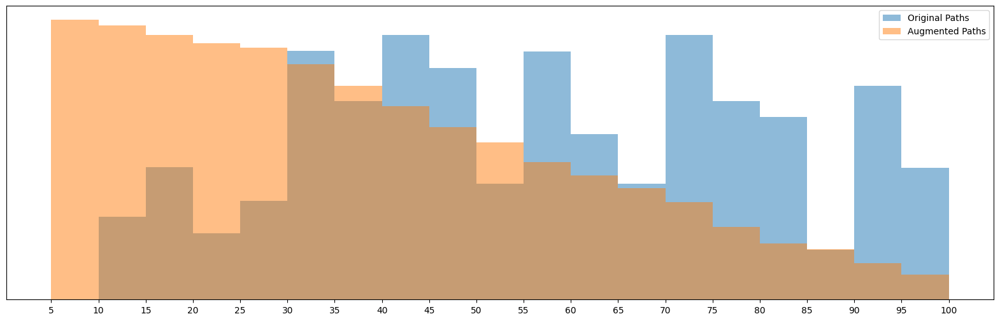

In [74]:
length_og = [len(path) for path in intermediate_paths]
Length_aug = [len(path) for path in paths]

fig, ax = plt.subplots(figsize=(20, 6))

ax.hist(length_og, bins=range(5, 101, 5), alpha=0.5, label="Original Paths", density=True)
ax.hist(Length_aug, bins=range(5, 101, 5), alpha=0.5, label="Augmented Paths", density=True)
ax.set_xticks(range(5, 101, 5))
ax.yaxis.set_visible(False)
ax.legend()

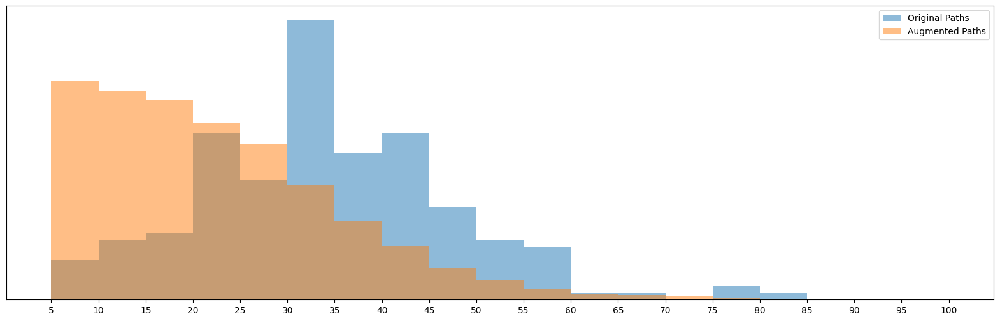

In [29]:
length_og = [len(path) for path in hybrid_paths]
subdivided_paths = []
for path, sequence in zip(hybrid_paths, hybrid_sequences_standardized):
    for i in range(5, min(len(path), 101)):
        subdivided_paths.append(path[:i])
Length_aug = [len(path) for path in subdivided_paths]

fig, ax = plt.subplots(figsize=(20, 6))

ax.hist(length_og, bins=range(5, 101, 5), alpha=0.5, label="Original Paths", density=True)
ax.hist(Length_aug, bins=range(5, 101, 5), alpha=0.5, label="Augmented Paths", density=True)
ax.set_xticks(range(5, 101, 5))
ax.yaxis.set_visible(False)
ax.legend()